## Import libraries and download the data

In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets
from torchvision.io import read_image
import glob
import cv2
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import timm
import dlib
import cv2
import os
from IPython import embed

import os
import cv2
import numpy as np
import pandas as pd
import timm
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import seaborn as sns

torch.manual_seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 16.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=4914a477c736085e8d4ee75781884a8b772ef4c15f6e95d7530ea6edb00596a0
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
!pip install facenet-pytorch
!pip install lime
!pip install dlib
!pip install onnx
!pip install onnxruntime
!pip install onnxsim

from IPython.display import clear_output
clear_output(wait=False)

In [ ]:
os.environ['KAGGLE_USERNAME'] = "utkuatasoy"
os.environ['KAGGLE_KEY'] = "d5988dfe4de46384e79e05f07160e202"

In [ ]:
# get icml_face_data.csv from kaggle as zip
!kaggle competitions download -c challenges-in-representation-learning-facial-expression-recognition-challenge -f icml_face_data.csv

 69% 67.0M/96.6M [00:00<00:00, 699MB/s]
100% 96.6M/96.6M [00:00<00:00, 728MB/s]


In [ ]:
# extract fer2013.tar.gz
!unzip '/content/icml_face_data.csv'
# delete unnecessary zip
!rm '/content/icml_face_data.csv.zip'

Archive:  /content/icml_face_data.csv
replace icml_face_data.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: icml_face_data.csv      
rm: cannot remove '/content/icml_face_data.csv.zip': No such file or directory


## Show the data format

In [ ]:
fer_df = pd.read_csv('/content/icml_face_data.csv')
fer_df = fer_df.rename(columns={"emotion": "emotion",
                                 "Usage": "Usage",
                                 "pixels": "pixels"})

In [ ]:
!pip install python-pptx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 472.8/472.8 kB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.1/165.1 kB 10.3 MB/s eta 0:00:00


In [ ]:
fer_df.head()

,emotion,Usage,pixels
0,0,Training,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...
1,0,Training,151 150 147 155 148 133 111 140 170 174 182 15...
2,2,Training,231 212 156 164 174 138 161 173 182 200 106 38...
3,4,Training,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...
4,6,Training,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...


In [ ]:
emotion_map = {0: "Angry", 1: "Disgust", 2: "Fear", 3: "Happy", 4: "Sad", 5: "Surprise", 6: "Neutral"}

In [ ]:
emotion_labels = fer_df["emotion"].apply(lambda x: emotion_map[x])
emotion_counts = emotion_labels.value_counts()
print(emotion_counts)

emotion
Happy       8989
Neutral     6198
Sad         6077
Fear        5121
Angry       4953
Surprise    4002
Disgust      547
Name: count, dtype: int64


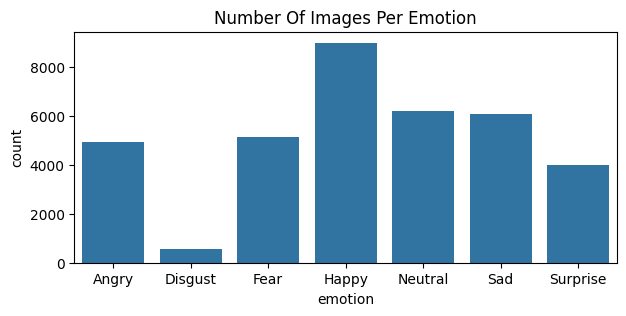

In [ ]:
plt.figure(figsize=(7,3))
plt.title("Number Of Images Per Emotion")
sns.countplot(x=emotion_labels.sort_values())
plt.show()

In [ ]:
from typing import Dict, List

images: List[np.ndarray] = []
images_without_disgust: List[np.ndarray] = []
labels: List[int] = []
labels_without_disgust: List[int] = []
fer_df.columns = ["emotion", "Usage", "pixels"]

# Split pixel string and reshape to 48x48
for index, row in fer_df.iterrows():
    image_arr: List[str] = row["pixels"].split(" ")
    image: np.ndarray = np.asarray(image_arr, dtype=np.float32).reshape((48, 48))
    images.append(image)
    labels.append(row["emotion"])

In [ ]:
# Convert lists to numpy arrays
images = np.asarray(images)
labels = np.asarray(labels)

print(f"Images shape: {images.shape}")
print(f"Labels shape: {labels.shape}")

Images shape: (35887, 48, 48)
Labels shape: (35887,)


In [ ]:
images[0]

array([[ 70.,  80.,  82., ...,  52.,  43.,  41.],
       [ 65.,  61.,  58., ...,  56.,  52.,  44.],
       [ 50.,  43.,  54., ...,  49.,  56.,  47.],
       ...,
       [ 91.,  65.,  42., ...,  72.,  56.,  43.],
       [ 77.,  82.,  79., ..., 105.,  70.,  46.],
       [ 77.,  72.,  84., ..., 106., 109.,  82.]], dtype=float32)

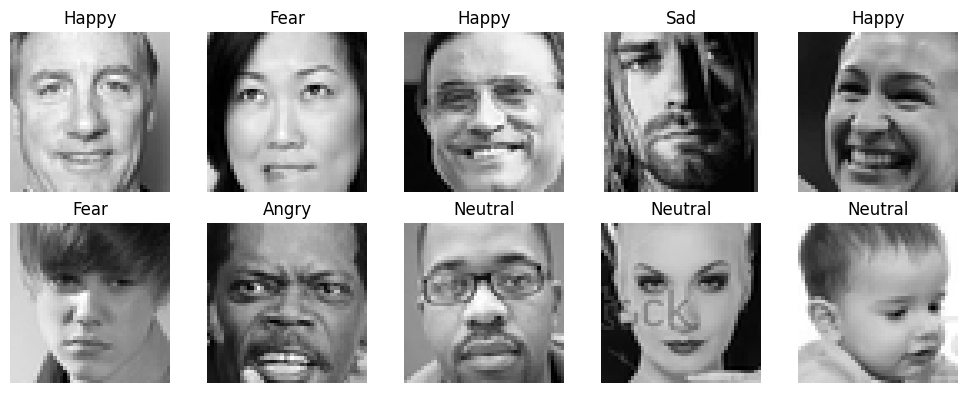

In [ ]:
import matplotlib.pyplot as plt
import random

fig, ax = plt.subplots(2, 5, figsize=(10, 4))

# Define the indices of images to display
sample_indices = [6000, 6500, 5000, 6297, 28000, 6296, 10, 12300, 3400, 3800]

# Shuffle the list to randomize the order
random.shuffle(sample_indices)

# Create positions for a 2x5 grid
positions = [(i, j) for i in range(2) for j in range(5)]

for pos, idx in zip(positions, sample_indices):
    ax[pos].imshow(images[idx], cmap="gray", interpolation='nearest')
    ax[pos].axis('off')
    ax[pos].set_title(emotion_map[labels[idx]])

plt.tight_layout()
plt.show()


In [ ]:
csv_path = '/content/icml_face_data.csv'
data_df = pd.read_csv(csv_path)
data_df.columns = data_df.columns.str.strip()  # This will remove extra whitespace.
data_df = data_df.drop("Usage", axis=1)
data_df.head()

,emotion,pixels
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...
1,0,151 150 147 155 148 133 111 140 170 174 182 15...
2,2,231 212 156 164 174 138 161 173 182 200 106 38...
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...


## Data transformations

In [ ]:
train_val_df, test_df = train_test_split(
    data_df, test_size=0.2, random_state=42, stratify=data_df['emotion']
)

train_df, val_df = train_test_split(
    train_val_df, test_size=0.2, random_state=42, stratify=train_val_df['emotion']
)

print("Train shape:", train_df.shape)
print("Validation shape:", val_df.shape)
print("Test shape:", test_df.shape)

Train shape: (22967, 2)
Validation shape: (5742, 2)
Test shape: (7178, 2)


In [ ]:
train_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((96, 96)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet normalization
                         std=[0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((96, 96)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
class FERDataset(Dataset):
    """
    Facial Expression Recognition Dataset.

    Args:
        dataframe (pd.DataFrame): DataFrame loaded from the CSV file.
        transform: Transformations to apply to the image.
        exclude_disgust (bool): If True, remove the disgust class and adjust labels.
    """
    def __init__(self, dataframe, transform=None, exclude_disgust=False):
        self.data = dataframe.copy()
        self.transform = transform
        self.exclude_disgust = exclude_disgust

        # Optionally remove disgust (emotion==1) and re-map labels:
        if self.exclude_disgust:
            self.data = self.data[self.data['emotion'] != 1].reset_index(drop=True)
            # Adjust labels: keep label 0 as "Angry"; for others subtract 1.
            self.data['emotion'] = self.data['emotion'].apply(lambda x: x if x == 0 else x - 1)

        # Convert the pixel string to a 48x48 numpy array of float32
        self.data['pixels'] = self.data['pixels'].apply(
            lambda x: np.array(x.split(" "), dtype=np.float32).reshape((48, 48))
        )

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        image = row['pixels']  # shape (48, 48)
        image = cv2.cvtColor(np.uint8(image), cv2.COLOR_GRAY2RGB)
        if self.transform:
            image = self.transform(image)
        label = int(row['emotion'])
        return image, label


In [ ]:
exclude_disgust = False

if exclude_disgust:
    emotion_map = {
        0: "Angry",
        1: "Fear",
        2: "Happy",
        3: "Sad",
        4: "Surprise",
        5: "Neutral"
    }
else:
    emotion_map = {
        0: "Angry",
        1: "Disgust",
        2: "Fear",
        3: "Happy",
        4: "Sad",
        5: "Surprise",
        6: "Neutral"
    }

train_dataset = FERDataset(train_df, transform=train_transforms, exclude_disgust=exclude_disgust)
val_dataset   = FERDataset(val_df, transform=val_test_transforms, exclude_disgust=exclude_disgust)
test_dataset  = FERDataset(test_df, transform=val_test_transforms, exclude_disgust=exclude_disgust)

In [ ]:
def create_undersampled_df(df: pd.DataFrame) -> pd.DataFrame:
    """
    Undersample all classes except 'Disgust' (label 1) so that every class has
    the same number of samples as the disgust class.
    """
    counts = df['emotion'].value_counts()
    # Get the count for the disgust class (label 1)
    minority_count = counts.loc[1]
    undersampled_dfs = []
    for emotion, count in counts.items():
        df_emotion = df[df['emotion'] == emotion]
        if emotion == 1:
            undersampled_dfs.append(df_emotion)  # Keep all disgust samples
        else:
            undersampled_dfs.append(df_emotion.sample(n=minority_count, random_state=42))
    return pd.concat(undersampled_dfs).reset_index(drop=True)

def create_oversampled_df(df: pd.DataFrame) -> pd.DataFrame:
    """
    Oversample the disgust class (label 1) using replication so that the number of
    disgust samples equals the maximum count among the other classes.
    """
    counts = df['emotion'].value_counts()
    # Get the maximum count among non-disgust classes
    majority_count = counts.drop(1).max()
    oversampled_dfs = []
    for emotion, count in counts.items():
        df_emotion = df[df['emotion'] == emotion]
        if emotion == 1:
            # Compute how many times we need to replicate
            replicate_times = int(np.ceil(majority_count / count))
            df_rep = pd.concat([df_emotion] * replicate_times, ignore_index=True)
            df_rep = df_rep.sample(n=majority_count, random_state=42)
            oversampled_dfs.append(df_rep)
        else:
            oversampled_dfs.append(df_emotion)
    return pd.concat(oversampled_dfs).reset_index(drop=True)


In [ ]:
# Create undersampled and oversampled train DataFrames from train_df
train_df_undersampled = create_undersampled_df(train_df)
train_df_oversampled   = create_oversampled_df(train_df)

Plot Class Distributions After Balancing

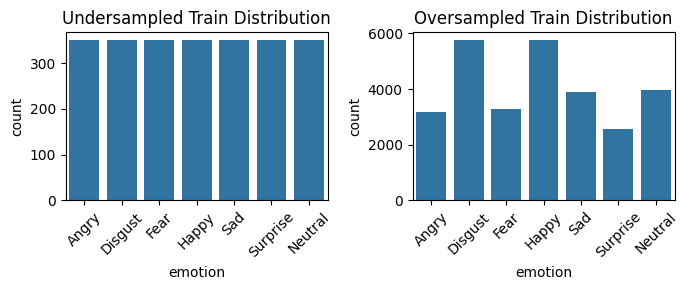

In [ ]:
plt.figure(figsize=(7,3))

plt.subplot(1,2,1)
sns.countplot(x='emotion', data=train_df_undersampled, order=sorted(train_df_undersampled['emotion'].unique()))
plt.title("Undersampled Train Distribution")
# Replace numeric labels with emotion names
plt.xticks(ticks=range(len(emotion_map)), labels=[emotion_map[i] for i in sorted(emotion_map.keys())], rotation=45)

plt.subplot(1,2,2)
sns.countplot(x='emotion', data=train_df_oversampled, order=sorted(train_df_oversampled['emotion'].unique()))
plt.title("Oversampled Train Distribution")
plt.xticks(ticks=range(len(emotion_map)), labels=[emotion_map[i] for i in sorted(emotion_map.keys())], rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
def create_hybrid_sample_df(df: pd.DataFrame, target_count: int) -> pd.DataFrame:
    """
    For each class, if the class count is greater than target_count,
    undersample without replacement. If it is less, oversample with replacement.
    """
    hybrid_samples = []
    for emotion, group in df.groupby('emotion'):
        n_samples = len(group)
        if n_samples > target_count:
            # Undersample the majority class.
            sampled_group = group.sample(n=target_count, random_state=42, replace=False)
        else:
            # Oversample the minority class.
            sampled_group = group.sample(n=target_count, random_state=42, replace=True)
        hybrid_samples.append(sampled_group)
    return pd.concat(hybrid_samples).reset_index(drop=True)

# Choose a target count per class (this is a hyperparameter you can tune)
target_count = 8989
train_df_hybrid = create_hybrid_sample_df(train_df, target_count=target_count)

 Plot Class Distributions Before and After Hybrid Sampling

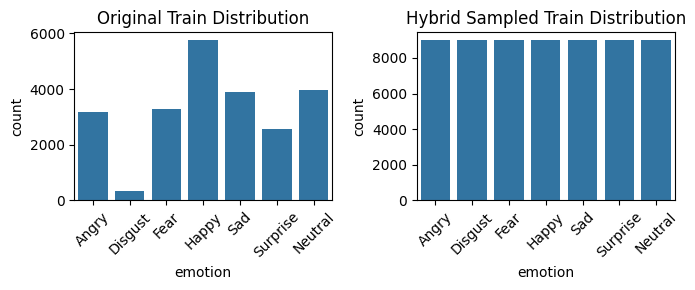

In [ ]:
plt.figure(figsize=(7,3))

plt.subplot(1,2,1)
sns.countplot(x='emotion', data=train_df, order=sorted(train_df['emotion'].unique()))
plt.title("Original Train Distribution")
plt.xticks(ticks=range(len(emotion_map)), labels=[emotion_map[i] for i in sorted(emotion_map.keys())], rotation=45)

plt.subplot(1,2,2)
sns.countplot(x='emotion', data=train_df_hybrid, order=sorted(train_df_hybrid['emotion'].unique()))
plt.title("Hybrid Sampled Train Distribution")
plt.xticks(ticks=range(len(emotion_map)), labels=[emotion_map[i] for i in sorted(emotion_map.keys())], rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
train_dataset_under = FERDataset(train_df_undersampled, transform=train_transforms, exclude_disgust=False)
train_dataset_over  = FERDataset(train_df_oversampled, transform=train_transforms, exclude_disgust=False)
train_dataset_hybrid = FERDataset(train_df_hybrid, transform=train_transforms, exclude_disgust=False)

In [ ]:
# Create DataLoaders
batch_size = 64

# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
# train_loader = DataLoader(train_dataset_under, batch_size=batch_size, shuffle=True, num_workers=4)
# train_loader = DataLoader(train_dataset_over, batch_size=batch_size, shuffle=True, num_workers=4)

train_loader = DataLoader(train_dataset_hybrid, batch_size=64, shuffle=True, num_workers=4)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Set number of classes based on whether disgust is excluded or not.
num_classes = 6 if exclude_disgust else 7

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
import torch
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha  # Tensor of shape (num_classes,)
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        logpt = F.log_softmax(inputs, dim=1)
        pt = torch.exp(logpt)
        # Get the log probability of the target class.
        logpt = logpt.gather(1, targets.unsqueeze(1)).squeeze(1)
        pt = pt.gather(1, targets.unsqueeze(1)).squeeze(1)
        # Compute focal loss
        loss = - (1 - pt) ** self.gamma * logpt
        # Apply alpha if provided
        if self.alpha is not None:
            if self.alpha.type() != inputs.data.type():
                self.alpha = self.alpha.type_as(inputs.data)
            at = self.alpha.gather(0, targets)
            loss = loss * at
        if self.reduction == 'mean':
            return loss.mean()
        else:
            return loss.sum()


## Training

In [ ]:
from tqdm import tqdm
import torch

def train_model(model, optimizer, criterion, train_loader, val_loader, device, num_epochs=30, model_save_path="xception.pth"):
    best_val_acc = 0.0
    # Training
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        correct_train = 0
        total_train = 0
        train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training", leave=False)

        for images, labels in train_bar:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            total_train += labels.size(0)
            correct_train += predicted.eq(labels).sum().item()
            train_bar.set_postfix(loss=f"{loss.item():.4f}")

        train_loss /= total_train
        train_acc = correct_train / total_train

        # Validation
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0
        val_bar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validation", leave=False)

        with torch.no_grad():
            for images, labels in val_bar:
                images = images.to(device)
                labels = labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                _, predicted = outputs.max(1)
                total_val += labels.size(0)
                correct_val += predicted.eq(labels).sum().item()
                val_bar.set_postfix(loss=f"{loss.item():.4f}")

        val_loss /= total_val
        val_acc = correct_val / total_val

        print(f"Epoch {epoch+1}/{num_epochs}  Train Loss: {train_loss:.4f}  Train Acc: {train_acc:.4f}  Val Loss: {val_loss:.4f}  Val Acc: {val_acc:.4f}")

        # Save the best val acc model
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), model_save_path)

    return model


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('xception', pretrained=True, num_classes=num_classes)
model = model.to(device)

# Default Approach
criterion = nn.CrossEntropyLoss()

# Median count: 5121
# Angry: 5121/4953 ≈ 1.034 Disgust: 5121/547 ≈ 9.36 Fear: 5121/5121 = 1.000
# Happy: 5121/8989 ≈ 0.57 Sad: 5121/6077 ≈ 0.84 Surprise: 5121/4002 ≈ 1.28 Neutral: 5121/6198 ≈ 0.83

# Class‑Weighted Loss Approach
# class_weights = torch.tensor([1.034, 9.36, 1.0, 0.57, 0.84, 1.28, 0.83], dtype=torch.float).to(device)
# criterion = nn.CrossEntropyLoss(weight=class_weights)

# Focal Loss
# alpha = torch.tensor([1.034, 9  .36, 1.0, 0.57, 0.84, 1.28, 0.83], dtype=torch.float).to(device)
# criterion = FocalLoss(alpha=alpha, gamma=2, reduction='mean')

optimizer = optim.Adam(model.parameters(), lr=1e-4)

trained_model = train_model(model, optimizer, criterion, train_loader, val_loader, device, num_epochs=30, model_save_path="/content/xception.pth")

Epoch 1/30  Train Loss: 1.4436  Train Acc: 0.3350  Val Loss: 2.1048  Val Acc: 0.2945


Epoch 2/30  Train Loss: 0.6791  Train Acc: 0.4956  Val Loss: 1.6241  Val Acc: 0.4040


Epoch 3/30  Train Loss: 0.5008  Train Acc: 0.5908  Val Loss: 1.4676  Val Acc: 0.4768


Epoch 4/30  Train Loss: 0.4017  Train Acc: 0.6687  Val Loss: 1.4492  Val Acc: 0.5240


Epoch 5/30  Train Loss: 0.3236  Train Acc: 0.7339  Val Loss: 1.5085  Val Acc: 0.5411


Epoch 6/30  Train Loss: 0.2566  Train Acc: 0.7899  Val Loss: 1.5836  Val Acc: 0.5596


Epoch 7/30  Train Loss: 0.1933  Train Acc: 0.8455  Val Loss: 1.6346  Val Acc: 0.5791


Epoch 8/30  Train Loss: 0.1558  Train Acc: 0.8784  Val Loss: 1.7141  Val Acc: 0.5737


Epoch 9/30  Train Loss: 0.1158  Train Acc: 0.9111  Val Loss: 1.8396  Val Acc: 0.5843


Epoch 10/30  Train Loss: 0.0954  Train Acc: 0.9283  Val Loss: 1.8498  Val Acc: 0.5953


Epoch 11/30  Train Loss: 0.0752  Train Acc: 0.9442  Val Loss: 1.9220  Val Acc: 0.5939


Epoch 12/30  Train Loss: 0.0658  Train Acc: 0.9544  Val Loss: 1.9475  Val Acc: 0.5825


Epoch 13/30  Train Loss: 0.0516  Train Acc: 0.9627  Val Loss: 2.0882  Val Acc: 0.6057


Epoch 14/30  Train Loss: 0.0463  Train Acc: 0.9666  Val Loss: 2.0761  Val Acc: 0.6047


Epoch 15/30  Train Loss: 0.0408  Train Acc: 0.9714  Val Loss: 2.0576  Val Acc: 0.5974


Epoch 16/30  Train Loss: 0.0411  Train Acc: 0.9698  Val Loss: 2.0507  Val Acc: 0.6003


Epoch 17/30  Train Loss: 0.0380  Train Acc: 0.9733  Val Loss: 2.0700  Val Acc: 0.5930


Epoch 18/30  Train Loss: 0.0309  Train Acc: 0.9776  Val Loss: 2.1426  Val Acc: 0.6076


Epoch 19/30  Train Loss: 0.0315  Train Acc: 0.9784  Val Loss: 2.1190  Val Acc: 0.6087


Epoch 20/30  Train Loss: 0.0289  Train Acc: 0.9794  Val Loss: 2.2021  Val Acc: 0.6082


Epoch 21/30  Train Loss: 0.0262  Train Acc: 0.9810  Val Loss: 2.2362  Val Acc: 0.6097


Epoch 22/30  Train Loss: 0.0217  Train Acc: 0.9851  Val Loss: 2.2714  Val Acc: 0.6064


Epoch 23/30  Train Loss: 0.0294  Train Acc: 0.9795  Val Loss: 2.3819  Val Acc: 0.6101


Epoch 24/30  Train Loss: 0.0213  Train Acc: 0.9848  Val Loss: 2.4201  Val Acc: 0.6191


Epoch 25/30  Train Loss: 0.0178  Train Acc: 0.9875  Val Loss: 2.3709  Val Acc: 0.6132


Epoch 26/30  Train Loss: 0.0195  Train Acc: 0.9864  Val Loss: 2.3912  Val Acc: 0.6125


Epoch 27/30  Train Loss: 0.0193  Train Acc: 0.9867  Val Loss: 2.4794  Val Acc: 0.6040


Epoch 28/30  Train Loss: 0.0215  Train Acc: 0.9848  Val Loss: 2.3695  Val Acc: 0.6177


Epoch 29/30  Train Loss: 0.0172  Train Acc: 0.9883  Val Loss: 2.4541  Val Acc: 0.6097


Epoch 30/30  Train Loss: 0.0174  Train Acc: 0.9877  Val Loss: 2.4806  Val Acc: 0.6188


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('mobilenetv3_large_100', pretrained=True, num_classes=num_classes)
model = model.to(device)

# Default Approach
# criterion = nn.CrossEntropyLoss()

# Median count: 5121
# Angry: 5121/4953 ≈ 1.034 Disgust: 5121/547 ≈ 9.36 Fear: 5121/5121 = 1.000
# Happy: 5121/8989 ≈ 0.57 Sad: 5121/6077 ≈ 0.84 Surprise: 5121/4002 ≈ 1.28 Neutral: 5121/6198 ≈ 0.83

# Class‑Weighted Loss Approach
# class_weights = torch.tensor([1.034, 9.36, 1.0, 0.57, 0.84, 1.28, 0.83], dtype=torch.float).to(device)
# criterion = nn.CrossEntropyLoss(weight=class_weights)

# Focal Loss
# alpha = torch.tensor([1.034, 9  .36, 1.0, 0.57, 0.84, 1.28, 0.83], dtype=torch.float).to(device)
# criterion = FocalLoss(alpha=alpha, gamma=2, reduction='mean')

optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

trained_model = train_model(model, optimizer, criterion, train_loader, val_loader, device, num_epochs=30, model_save_path="/content/mobilenet.pth")

Epoch 1/30  Train Loss: 1.4436  Train Acc: 0.3350  Val Loss: 2.1048  Val Acc: 0.2945


Epoch 2/30  Train Loss: 0.6791  Train Acc: 0.4956  Val Loss: 1.6241  Val Acc: 0.4040


Epoch 3/30  Train Loss: 0.5008  Train Acc: 0.5908  Val Loss: 1.4676  Val Acc: 0.4768


Epoch 4/30  Train Loss: 0.4017  Train Acc: 0.6687  Val Loss: 1.4492  Val Acc: 0.5240


Epoch 5/30  Train Loss: 0.3236  Train Acc: 0.7339  Val Loss: 1.5085  Val Acc: 0.5411


Epoch 6/30  Train Loss: 0.2566  Train Acc: 0.7899  Val Loss: 1.5836  Val Acc: 0.5596


Epoch 7/30  Train Loss: 0.1933  Train Acc: 0.8455  Val Loss: 1.6346  Val Acc: 0.5791


Epoch 8/30  Train Loss: 0.1558  Train Acc: 0.8784  Val Loss: 1.7141  Val Acc: 0.5737


Epoch 9/30  Train Loss: 0.1158  Train Acc: 0.9111  Val Loss: 1.8396  Val Acc: 0.5843


Epoch 10/30  Train Loss: 0.0954  Train Acc: 0.9283  Val Loss: 1.8498  Val Acc: 0.5953


Epoch 11/30  Train Loss: 0.0752  Train Acc: 0.9442  Val Loss: 1.9220  Val Acc: 0.5939


Epoch 12/30  Train Loss: 0.0658  Train Acc: 0.9544  Val Loss: 1.9475  Val Acc: 0.5825


Epoch 13/30  Train Loss: 0.0516  Train Acc: 0.9627  Val Loss: 2.0882  Val Acc: 0.6057


Epoch 14/30  Train Loss: 0.0463  Train Acc: 0.9666  Val Loss: 2.0761  Val Acc: 0.6047


Epoch 15/30  Train Loss: 0.0408  Train Acc: 0.9714  Val Loss: 2.0576  Val Acc: 0.5974


Epoch 16/30  Train Loss: 0.0411  Train Acc: 0.9698  Val Loss: 2.0507  Val Acc: 0.6003


Epoch 17/30  Train Loss: 0.0380  Train Acc: 0.9733  Val Loss: 2.0700  Val Acc: 0.5930


Epoch 18/30  Train Loss: 0.0309  Train Acc: 0.9776  Val Loss: 2.1426  Val Acc: 0.6076


Epoch 19/30  Train Loss: 0.0315  Train Acc: 0.9784  Val Loss: 2.1190  Val Acc: 0.6087


Epoch 20/30  Train Loss: 0.0289  Train Acc: 0.9794  Val Loss: 2.2021  Val Acc: 0.6082


Epoch 21/30  Train Loss: 0.0262  Train Acc: 0.9810  Val Loss: 2.2362  Val Acc: 0.6097


Epoch 22/30  Train Loss: 0.0217  Train Acc: 0.9851  Val Loss: 2.2714  Val Acc: 0.6064


Epoch 23/30  Train Loss: 0.0294  Train Acc: 0.9795  Val Loss: 2.3819  Val Acc: 0.6101


Epoch 24/30  Train Loss: 0.0213  Train Acc: 0.9848  Val Loss: 2.4201  Val Acc: 0.6191


Epoch 25/30  Train Loss: 0.0178  Train Acc: 0.9875  Val Loss: 2.3709  Val Acc: 0.6132


Epoch 26/30  Train Loss: 0.0195  Train Acc: 0.9864  Val Loss: 2.3912  Val Acc: 0.6125


Epoch 27/30  Train Loss: 0.0193  Train Acc: 0.9867  Val Loss: 2.4794  Val Acc: 0.6040


Epoch 28/30  Train Loss: 0.0215  Train Acc: 0.9848  Val Loss: 2.3695  Val Acc: 0.6177


Epoch 29/30  Train Loss: 0.0172  Train Acc: 0.9883  Val Loss: 2.4541  Val Acc: 0.6097


Epoch 30/30  Train Loss: 0.0174  Train Acc: 0.9877  Val Loss: 2.4806  Val Acc: 0.6188


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=num_classes)
model = model.to(device)

# Default Approach
# criterion = nn.CrossEntropyLoss()

# Median count: 5121
# Angry: 5121/4953 ≈ 1.034 Disgust: 5121/547 ≈ 9.36 Fear: 5121/5121 = 1.000
# Happy: 5121/8989 ≈ 0.57 Sad: 5121/6077 ≈ 0.84 Surprise: 5121/4002 ≈ 1.28 Neutral: 5121/6198 ≈ 0.83

# Class‑Weighted Loss Approach
# class_weights = torch.tensor([1.034, 9.36, 1.0, 0.57, 0.84, 1.28, 0.83], dtype=torch.float).to(device)
# criterion = nn.CrossEntropyLoss(weight=class_weights)

# Focal Loss
# alpha = torch.tensor([1.034, 9  .36, 1.0, 0.57, 0.84, 1.28, 0.83], dtype=torch.float).to(device)
# criterion = FocalLoss(alpha=alpha, gamma=2, reduction='mean')

optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

trained_model = train_model(model, optimizer, criterion, train_loader, val_loader, device, num_epochs=30, model_save_path="/content/efficientnet.pth")

Epoch 1/30  Train Loss: 1.6284  Train Acc: 0.3537  Val Loss: 2.4038  Val Acc: 0.3330


Epoch 2/30  Train Loss: 0.6657  Train Acc: 0.5186  Val Loss: 1.6158  Val Acc: 0.4347


Epoch 3/30  Train Loss: 0.4664  Train Acc: 0.6214  Val Loss: 1.4998  Val Acc: 0.5045


Epoch 4/30  Train Loss: 0.3617  Train Acc: 0.7031  Val Loss: 1.4530  Val Acc: 0.5329


Epoch 5/30  Train Loss: 0.2749  Train Acc: 0.7759  Val Loss: 1.5388  Val Acc: 0.5566


Epoch 6/30  Train Loss: 0.2133  Train Acc: 0.8312  Val Loss: 1.5935  Val Acc: 0.5723


Epoch 7/30  Train Loss: 0.1597  Train Acc: 0.8749  Val Loss: 1.6701  Val Acc: 0.5850


Epoch 8/30  Train Loss: 0.1134  Train Acc: 0.9127  Val Loss: 1.7745  Val Acc: 0.5825


Epoch 9/30  Train Loss: 0.0883  Train Acc: 0.9334  Val Loss: 1.8967  Val Acc: 0.5895


Epoch 10/30  Train Loss: 0.0727  Train Acc: 0.9463  Val Loss: 1.9698  Val Acc: 0.5920


Epoch 11/30  Train Loss: 0.0609  Train Acc: 0.9546  Val Loss: 2.0708  Val Acc: 0.5886


Epoch 12/30  Train Loss: 0.0534  Train Acc: 0.9608  Val Loss: 2.0876  Val Acc: 0.6021


Epoch 13/30  Train Loss: 0.0410  Train Acc: 0.9708  Val Loss: 2.1790  Val Acc: 0.5940


Epoch 14/30  Train Loss: 0.0378  Train Acc: 0.9737  Val Loss: 2.2228  Val Acc: 0.6047


Epoch 15/30  Train Loss: 0.0436  Train Acc: 0.9690  Val Loss: 2.1842  Val Acc: 0.5970


Epoch 16/30  Train Loss: 0.0315  Train Acc: 0.9773  Val Loss: 2.2948  Val Acc: 0.6062


Epoch 17/30  Train Loss: 0.0272  Train Acc: 0.9803  Val Loss: 2.3025  Val Acc: 0.6075


Epoch 18/30  Train Loss: 0.0291  Train Acc: 0.9790  Val Loss: 2.3484  Val Acc: 0.6066


Epoch 19/30  Train Loss: 0.0275  Train Acc: 0.9802  Val Loss: 2.3836  Val Acc: 0.6050


Epoch 20/30  Train Loss: 0.0244  Train Acc: 0.9829  Val Loss: 2.5052  Val Acc: 0.6001


Epoch 21/30  Train Loss: 0.0259  Train Acc: 0.9811  Val Loss: 2.2930  Val Acc: 0.6083


Epoch 22/30  Train Loss: 0.0258  Train Acc: 0.9815  Val Loss: 2.3199  Val Acc: 0.6172


Epoch 23/30  Train Loss: 0.0193  Train Acc: 0.9861  Val Loss: 2.4235  Val Acc: 0.6101


Epoch 24/30  Train Loss: 0.0218  Train Acc: 0.9848  Val Loss: 2.4144  Val Acc: 0.6163


Epoch 25/30  Train Loss: 0.0234  Train Acc: 0.9832  Val Loss: 2.4974  Val Acc: 0.6179


Epoch 26/30  Train Loss: 0.0174  Train Acc: 0.9869  Val Loss: 2.5541  Val Acc: 0.6078


Epoch 27/30  Train Loss: 0.0261  Train Acc: 0.9821  Val Loss: 2.5821  Val Acc: 0.6118


Epoch 28/30  Train Loss: 0.0151  Train Acc: 0.9890  Val Loss: 2.6066  Val Acc: 0.6050


Epoch 29/30  Train Loss: 0.0159  Train Acc: 0.9881  Val Loss: 2.6287  Val Acc: 0.6120


Epoch 30/30  Train Loss: 0.0192  Train Acc: 0.9867  Val Loss: 2.6185  Val Acc: 0.6116


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('resnet18', pretrained=True, num_classes=num_classes)
model = model.to(device)

# Default Approach
# criterion = nn.CrossEntropyLoss()

# Median count: 5121
# Angry: 5121/4953 ≈ 1.034 Disgust: 5121/547 ≈ 9.36 Fear: 5121/5121 = 1.000
# Happy: 5121/8989 ≈ 0.57 Sad: 5121/6077 ≈ 0.84 Surprise: 5121/4002 ≈ 1.28 Neutral: 5121/6198 ≈ 0.83

# Class‑Weighted Loss Approach
# class_weights = torch.tensor([1.034, 9.36, 1.0, 0.57, 0.84, 1.28, 0.83], dtype=torch.float).to(device)
# criterion = nn.CrossEntropyLoss(weight=class_weights)

# Focal Loss
# alpha = torch.tensor([1.034, 9  .36, 1.0, 0.57, 0.84, 1.28, 0.83], dtype=torch.float).to(device)
# criterion = FocalLoss(alpha=alpha, gamma=2, reduction='mean')

optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

trained_model = train_model(model, optimizer, criterion, train_loader, val_loader, device, num_epochs=30, model_save_path="/content/resnet18.pth")

Epoch 1/30  Train Loss: 1.0667  Train Acc: 0.2094  Val Loss: 1.7906  Val Acc: 0.1764


Epoch 2/30  Train Loss: 0.6955  Train Acc: 0.4309  Val Loss: 1.4352  Val Acc: 0.4239


Epoch 3/30  Train Loss: 0.5570  Train Acc: 0.5380  Val Loss: 1.3301  Val Acc: 0.4831


Epoch 4/30  Train Loss: 0.4905  Train Acc: 0.5858  Val Loss: 1.2878  Val Acc: 0.5094


Epoch 5/30  Train Loss: 0.4463  Train Acc: 0.6221  Val Loss: 1.2659  Val Acc: 0.5359


Epoch 6/30  Train Loss: 0.4057  Train Acc: 0.6546  Val Loss: 1.2639  Val Acc: 0.5474


Epoch 7/30  Train Loss: 0.3763  Train Acc: 0.6816  Val Loss: 1.2496  Val Acc: 0.5662


Epoch 8/30  Train Loss: 0.3449  Train Acc: 0.7103  Val Loss: 1.2585  Val Acc: 0.5744


Epoch 9/30  Train Loss: 0.3149  Train Acc: 0.7349  Val Loss: 1.2645  Val Acc: 0.5813


Epoch 10/30  Train Loss: 0.2897  Train Acc: 0.7582  Val Loss: 1.2888  Val Acc: 0.5780


Epoch 11/30  Train Loss: 0.2599  Train Acc: 0.7853  Val Loss: 1.2888  Val Acc: 0.5916


Epoch 12/30  Train Loss: 0.2333  Train Acc: 0.8086  Val Loss: 1.3783  Val Acc: 0.5918


Epoch 13/30  Train Loss: 0.2116  Train Acc: 0.8284  Val Loss: 1.3929  Val Acc: 0.6040


Epoch 14/30  Train Loss: 0.1879  Train Acc: 0.8469  Val Loss: 1.4307  Val Acc: 0.6052


Epoch 15/30  Train Loss: 0.1681  Train Acc: 0.8667  Val Loss: 1.4907  Val Acc: 0.6017


Epoch 16/30  Train Loss: 0.1512  Train Acc: 0.8819  Val Loss: 1.5426  Val Acc: 0.5987


Epoch 17/30  Train Loss: 0.1350  Train Acc: 0.8935  Val Loss: 1.6152  Val Acc: 0.6019


Epoch 18/30  Train Loss: 0.1246  Train Acc: 0.9026  Val Loss: 1.6472  Val Acc: 0.6024


Epoch 19/30  Train Loss: 0.1098  Train Acc: 0.9142  Val Loss: 1.7123  Val Acc: 0.6003


Epoch 20/30  Train Loss: 0.1020  Train Acc: 0.9216  Val Loss: 1.7029  Val Acc: 0.6052


Epoch 21/30  Train Loss: 0.0901  Train Acc: 0.9311  Val Loss: 1.7900  Val Acc: 0.6066


Epoch 22/30  Train Loss: 0.0820  Train Acc: 0.9370  Val Loss: 1.8225  Val Acc: 0.6038


Epoch 23/30  Train Loss: 0.0746  Train Acc: 0.9424  Val Loss: 1.8394  Val Acc: 0.6118


Epoch 24/30  Train Loss: 0.0704  Train Acc: 0.9465  Val Loss: 1.8790  Val Acc: 0.6078


Epoch 25/30  Train Loss: 0.0641  Train Acc: 0.9527  Val Loss: 1.9431  Val Acc: 0.6160


Epoch 26/30  Train Loss: 0.0588  Train Acc: 0.9553  Val Loss: 1.9715  Val Acc: 0.6123


Epoch 27/30  Train Loss: 0.0539  Train Acc: 0.9596  Val Loss: 1.9787  Val Acc: 0.6176


Epoch 28/30  Train Loss: 0.0502  Train Acc: 0.9618  Val Loss: 2.0774  Val Acc: 0.6122


Epoch 29/30  Train Loss: 0.0446  Train Acc: 0.9669  Val Loss: 2.1233  Val Acc: 0.6149


Epoch 30/30  Train Loss: 0.0463  Train Acc: 0.9656  Val Loss: 2.0591  Val Acc: 0.6174


## Test for single model

In [ ]:
import matplotlib.patches as patches
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

def test_model(model, test_loader, criterion, class_names, device):
    # Denormalize the image
    def denormalize(img, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
        img = img.clone()
        for t, m, s in zip(img, mean, std):
            t.mul_(s).add_(m)
        return img

    model.eval()
    test_loss = 0.0
    total_test = 0
    correct_test = 0
    all_preds = []
    all_labels = []

    test_bar = tqdm(test_loader, desc="Testing", leave=False)
    with torch.no_grad():
        for images, labels in test_bar:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            test_loss += loss.item() * images.size(0)

            _, predicted = outputs.max(1)
            total_test += labels.size(0)
            correct_test += predicted.eq(labels).sum().item()

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            test_bar.set_postfix(loss=f"{loss.item():.4f}")

    test_loss /= total_test
    test_acc = correct_test / total_test

    sklearn_acc = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')

    print(f"Test Loss: {test_loss:.4f}  Test Acc: {test_acc:.4f}  Sklearn Acc: {sklearn_acc:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, digits=4))
    print(f"Precision: {precision:.4f}")
    print(f"Accuracy:  {sklearn_acc:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1 Score:  {f1:.4f}")

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(6, 4.5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="GnBu",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label", fontsize=8)
    plt.ylabel("True Label", fontsize=8)
    plt.title("Confusion Matrix", fontsize=10)
    plt.tight_layout()
    plt.show()
    plt.close()

    # Classs-based Classification Report Heatmap
    cls_report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)
    cls_report_filtered = {k: v for k, v in cls_report.items() if k in class_names}

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        np.array([list(cls_report_filtered[c].values())[:-1] for c in class_names]),
        annot=True, fmt=".2f", cmap="YlGnBu",
        xticklabels=['Precision', 'Recall', 'F1-Score'], yticklabels=class_names
    )
    plt.title("Classification Report", fontsize=12)
    plt.ylabel("Class")
    plt.xlabel("Metric")
    plt.tight_layout()
    plt.show()
    plt.close()

    f1_scores = [cls_report_filtered[c]['f1-score'] for c in class_names]
    plt.figure(figsize=(8, 4))
    sns.barplot(x=class_names, y=f1_scores, palette="viridis")
    plt.title("Expression-wise F1 Scores", fontsize=12)
    plt.ylabel("F1 Score")
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.show()
    plt.close()

    sample_images, sample_labels = next(iter(test_loader))
    sample_images = sample_images[:15]
    sample_labels = sample_labels[:15]

    with torch.no_grad():
        outputs = model(sample_images.to(device))
        _, preds = outputs.max(1)
    preds = preds.cpu().numpy()
    sample_labels = sample_labels.cpu().numpy()

    fig, axes = plt.subplots(3, 5, figsize=(15, 9))
    axes = axes.flatten()
    for i in range(15):
        image = denormalize(sample_images[i])
        image = image.cpu().numpy().transpose(1, 2, 0)
        image = np.clip(image, 0, 1)
        axes[i].imshow(image)
        axes[i].axis('off')
        true_label = class_names[sample_labels[i]]
        pred_label = class_names[preds[i]]
        axes[i].set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=8)
    plt.suptitle("Sample Predictions", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    plt.close()

    diverse_samples = {i: [] for i in range(len(class_names))}
    desired_per_class = 3

    for images, labels in test_loader:
        images = images.to(device)
        with torch.no_grad():
            outputs = model(images)
            _, preds = outputs.max(1)
        for i in range(len(labels)):
            label = labels[i].item()
            if len(diverse_samples[label]) < desired_per_class:
                diverse_samples[label].append((images[i].cpu(), label, preds[i].cpu().item()))
        total_samples = sum(len(v) for v in diverse_samples.values())
        if total_samples >= 15:
            break

    diverse_list = []
    for class_idx in sorted(diverse_samples.keys()):
        diverse_list.extend(diverse_samples[class_idx])
    diverse_list = diverse_list[:15]

    fig, axes = plt.subplots(3, 5, figsize=(15, 9))
    axes = axes.flatten()
    for idx, (img, true_label, pred_label) in enumerate(diverse_list):
        image = denormalize(img)
        image = image.numpy().transpose(1, 2, 0)
        image = np.clip(image, 0, 1)
        axes[idx].imshow(image)
        axes[idx].axis('off')
        axes[idx].set_title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}", fontsize=8)
        overlay_color = 'green' if true_label == pred_label else 'red'
        rect = patches.Rectangle(
            (0, 0), image.shape[1], image.shape[0],
            linewidth=3, edgecolor=overlay_color, facecolor=overlay_color, alpha=0.3
        )
        axes[idx].add_patch(rect)
    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')
    plt.suptitle("Diverse Sample Predictions", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    plt.close()

    with open("performance_metrics.txt", "w") as f:
        f.write("Precision: {:.4f}\nAccuracy: {:.4f}\nRecall: {:.4f}\nF1 Score: {:.4f}\n".format(precision, sklearn_acc, recall, f1))

    print("Performance metrics recorded in 'performance_metrics.txt'.")

Test Loss: 2.1953  Test Acc: 0.6545  Sklearn Acc: 0.6545

Classification Report:
              precision    recall  f1-score   support

           0     0.5438    0.5570    0.5503       991
           1     0.6316    0.5505    0.5882       109
           2     0.5356    0.4844    0.5087      1024
           3     0.8440    0.8515    0.8477      1798
           4     0.5725    0.5033    0.5357      1216
           5     0.7435    0.7900    0.7661       800
           6     0.5784    0.6573    0.6153      1240

    accuracy                         0.6545      7178
   macro avg     0.6356    0.6277    0.6303      7178
weighted avg     0.6523    0.6545    0.6523      7178

Precision: 0.6523
Accuracy:  0.6545
Recall:    0.6545
F1 Score:  0.6523


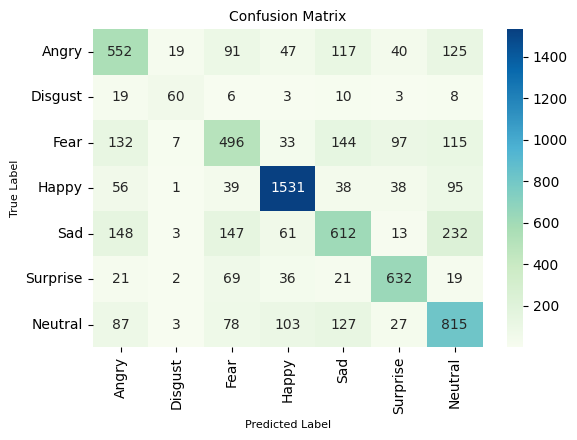

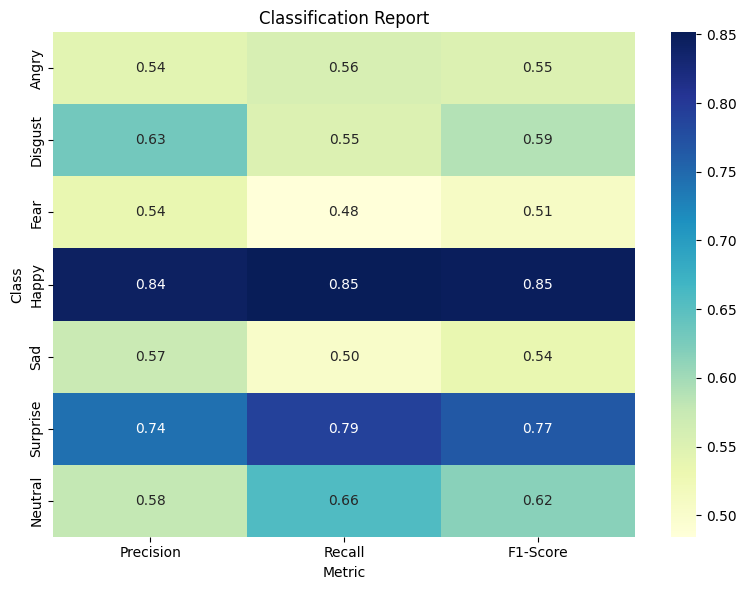

<ipython-input-40-be6d6ba9bcd6>:118: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1_scores, palette="viridis")


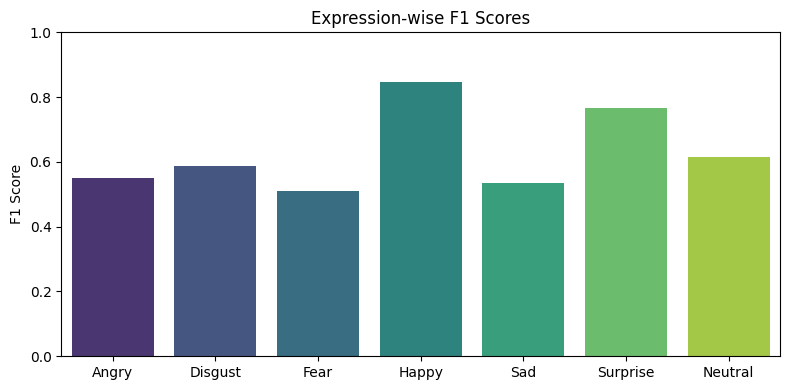

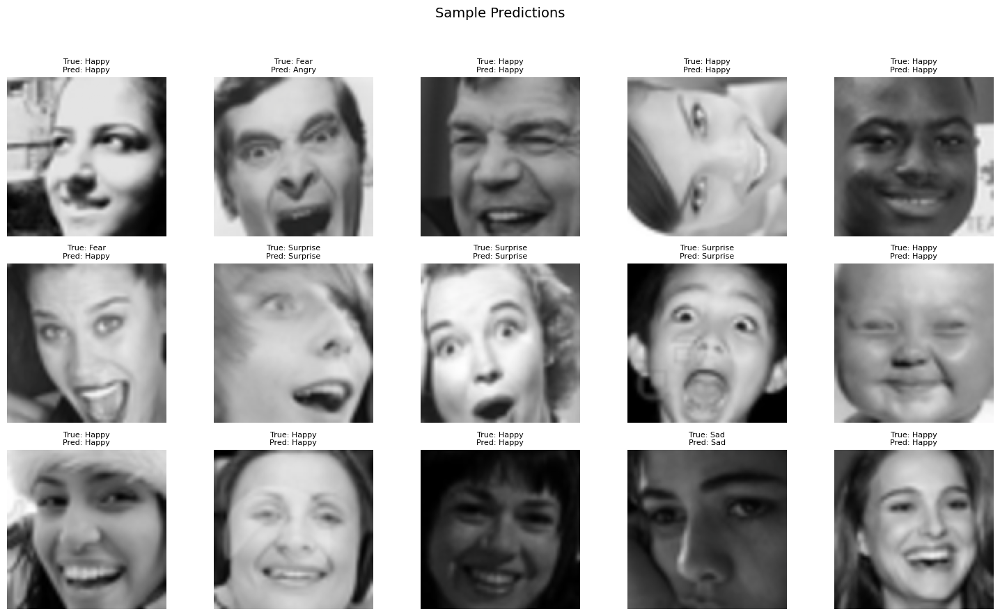

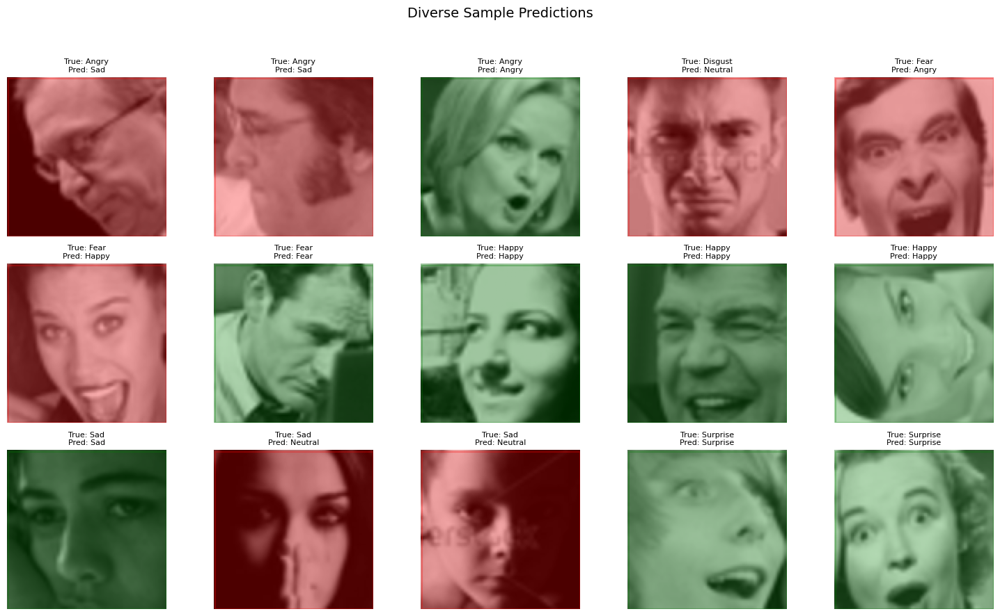

Performance metrics recorded in 'performance_metrics.txt'.


In [ ]:
class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
num_classes = len(class_names)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = timm.create_model('xception', pretrained=True, num_classes=num_classes)
model_path = "/content/xception.pth"  # Ağırlık dosya yolunu güncelleyin
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
class_weights = torch.tensor([1.034, 9.36, 1.0, 0.57, 0.84, 1.28, 0.83], dtype=torch.float).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

test_model(model, test_loader, criterion, class_names, device)

## Test for multiple models

/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name xception to current legacy_xception.
  model = create_fn(


Zipped: /content/7class_with_hybridsampling_8989_focal_loss.zip

Testing model: XceptionNet


Testing XceptionNet:   0%|          | 0/113 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


XceptionNet -> Test Loss: 2.4478  Test Acc: 0.6308  Sklearn Acc: 0.6308

Classification Report:
              precision    recall  f1-score   support

           0     0.5149    0.5399    0.5271       991
           1     0.8400    0.3853    0.5283       109
           2     0.4779    0.4326    0.4541      1024
           3     0.8473    0.8115    0.8290      1798
           4     0.5209    0.5321    0.5264      1216
           5     0.7085    0.7837    0.7442       800
           6     0.5903    0.6250    0.6071      1240

    accuracy                         0.6308      7178
   macro avg     0.6428    0.5872    0.6023      7178
weighted avg     0.6334    0.6308    0.6302      7178

Precision: 0.6334
Accuracy:  0.6308
Recall:    0.6308
F1 Score:  0.6302


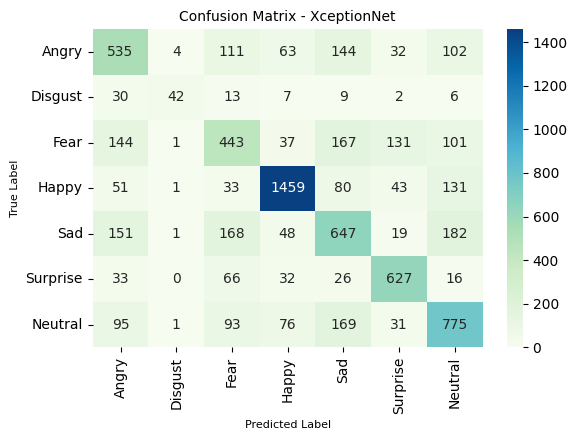

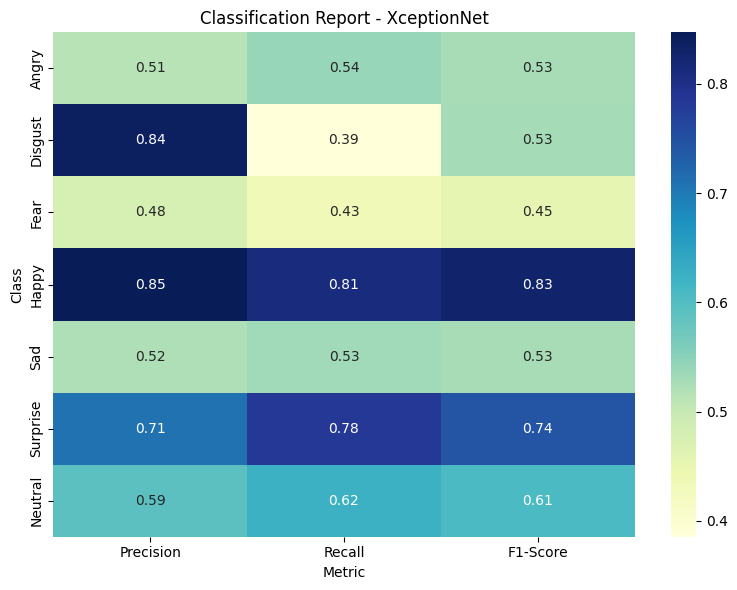

<ipython-input-34-9e06cfba0005>:170: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1_scores, palette="viridis")


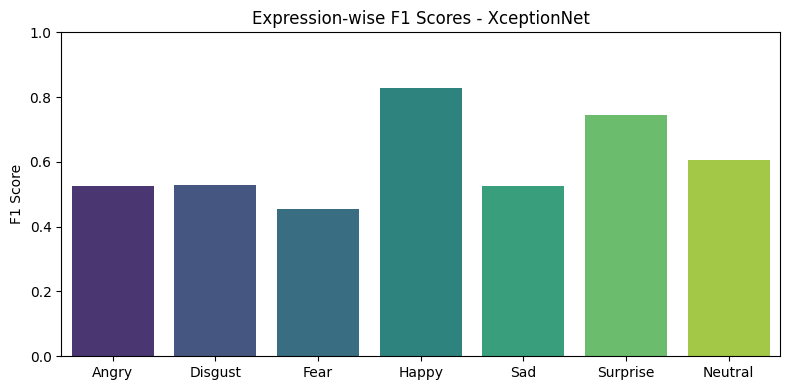

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


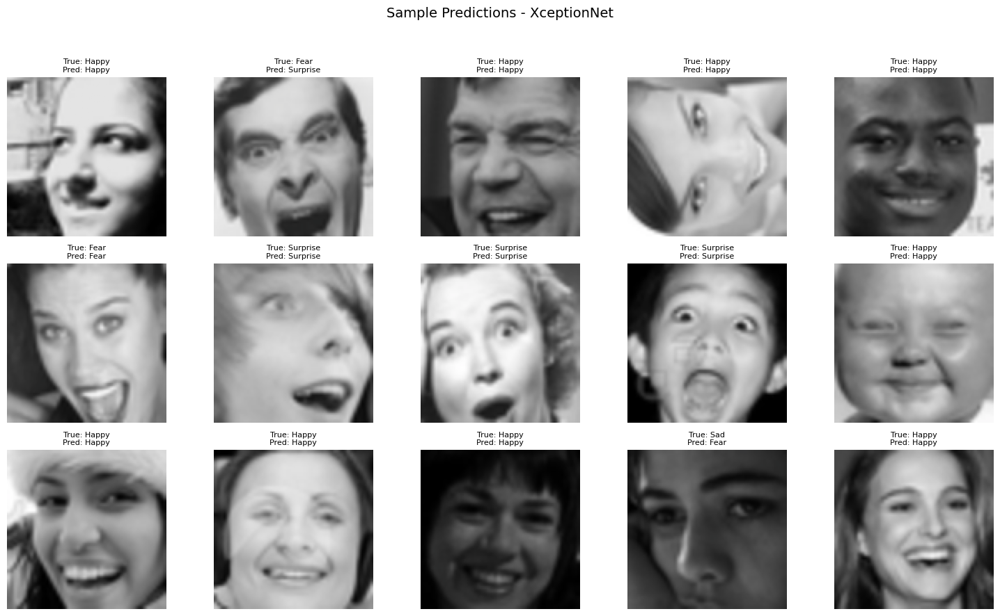

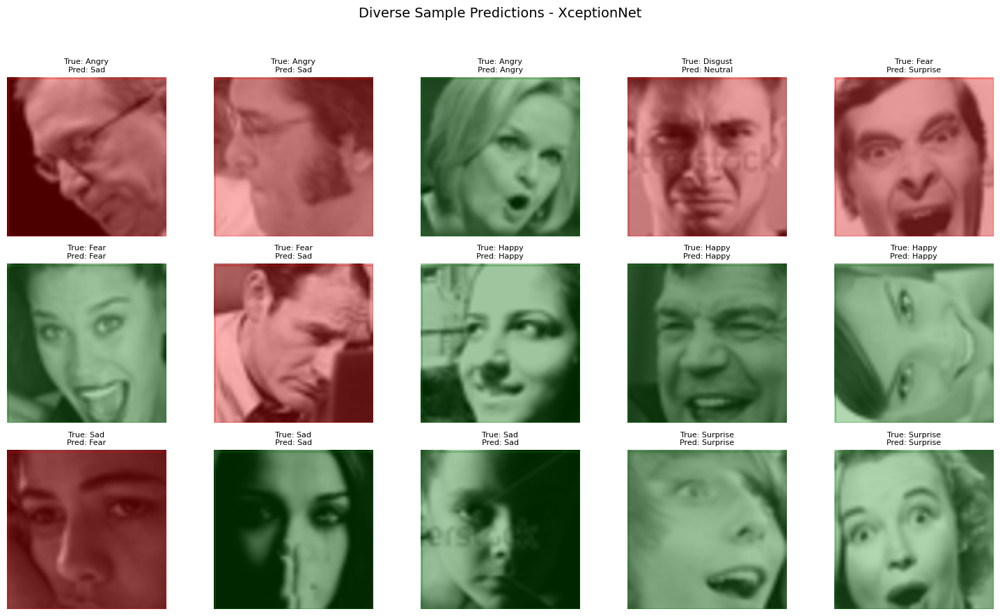


Testing model: MobileNet-V3-Large-100


MobileNet-V3-Large-100 -> Test Loss: 2.9118  Test Acc: 0.5469  Sklearn Acc: 0.5469

Classification Report:
              precision    recall  f1-score   support

           0     0.4230    0.4793    0.4494       991
           1     0.5763    0.3119    0.4048       109
           2     0.3954    0.3525    0.3727      1024
           3     0.7660    0.7592    0.7626      1798
           4     0.4260    0.4449    0.4352      1216
           5     0.6020    0.7375    0.6629       800
           6     0.5328    0.4516    0.4889      1240

    accuracy                         0.5469      7178
   macro avg     0.5316    0.5053    0.5109      7178
weighted avg     0.5467    0.5469    0.5444      7178

Precision: 0.5467
Accuracy:  0.5469
Recall:    0.5469
F1 Score:  0.5444


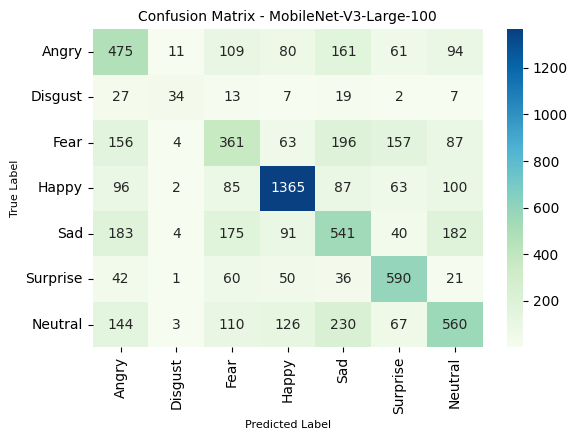

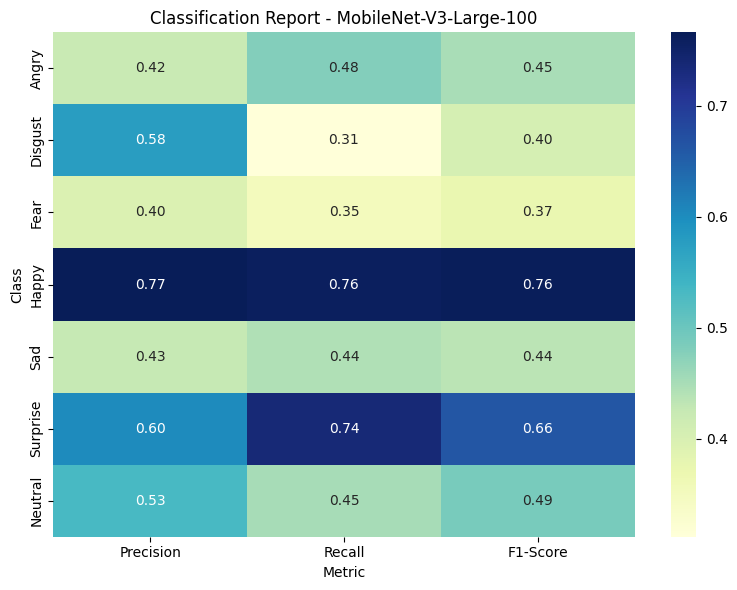

<ipython-input-34-9e06cfba0005>:170: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1_scores, palette="viridis")


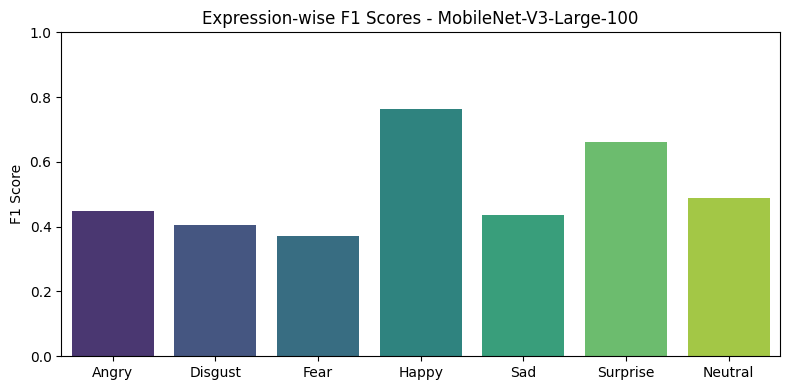

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


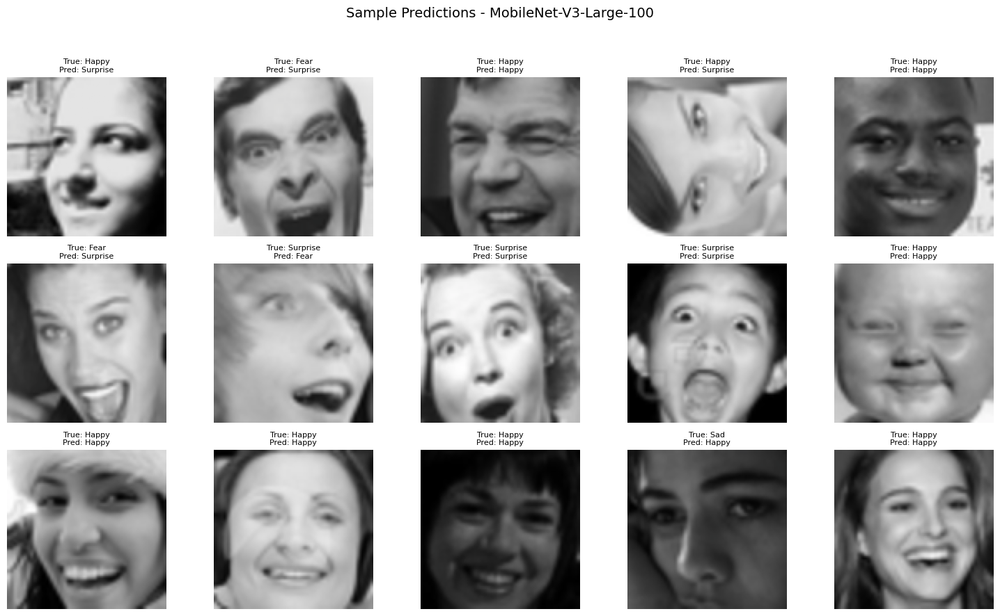

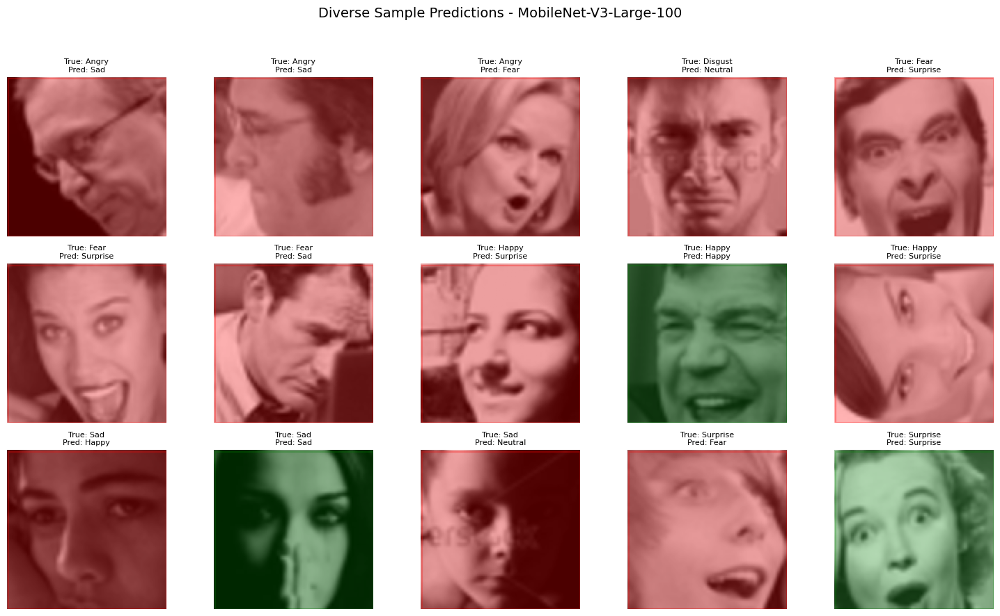


Testing model: EfficientNet-B0


EfficientNet-B0 -> Test Loss: 2.8053  Test Acc: 0.5549  Sklearn Acc: 0.5549

Classification Report:
              precision    recall  f1-score   support

           0     0.4482    0.4712    0.4594       991
           1     0.6029    0.3761    0.4633       109
           2     0.4093    0.3594    0.3827      1024
           3     0.7924    0.7536    0.7725      1798
           4     0.4357    0.4622    0.4485      1216
           5     0.6350    0.7262    0.6776       800
           6     0.4856    0.4911    0.4884      1240

    accuracy                         0.5549      7178
   macro avg     0.5442    0.5200    0.5275      7178
weighted avg     0.5564    0.5549    0.5544      7178

Precision: 0.5564
Accuracy:  0.5549
Recall:    0.5549
F1 Score:  0.5544


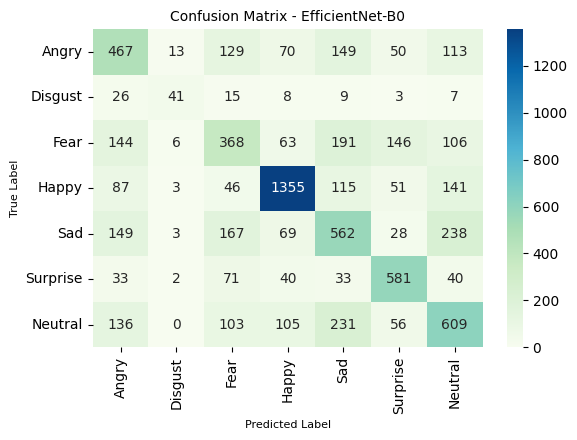

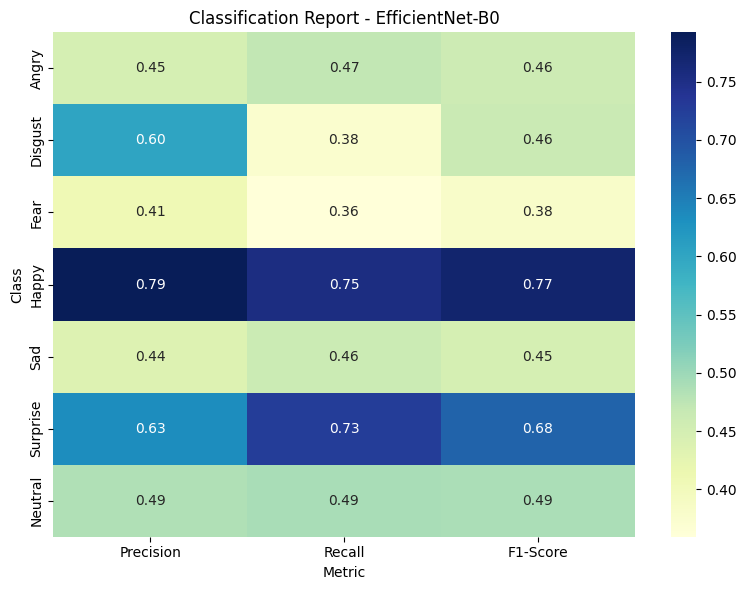

<ipython-input-34-9e06cfba0005>:170: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1_scores, palette="viridis")


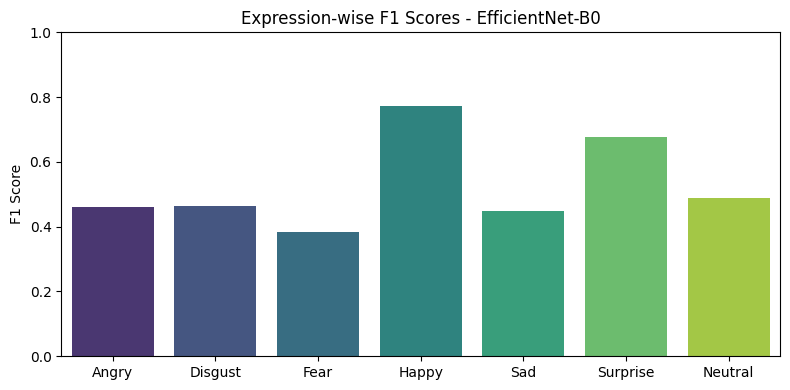

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


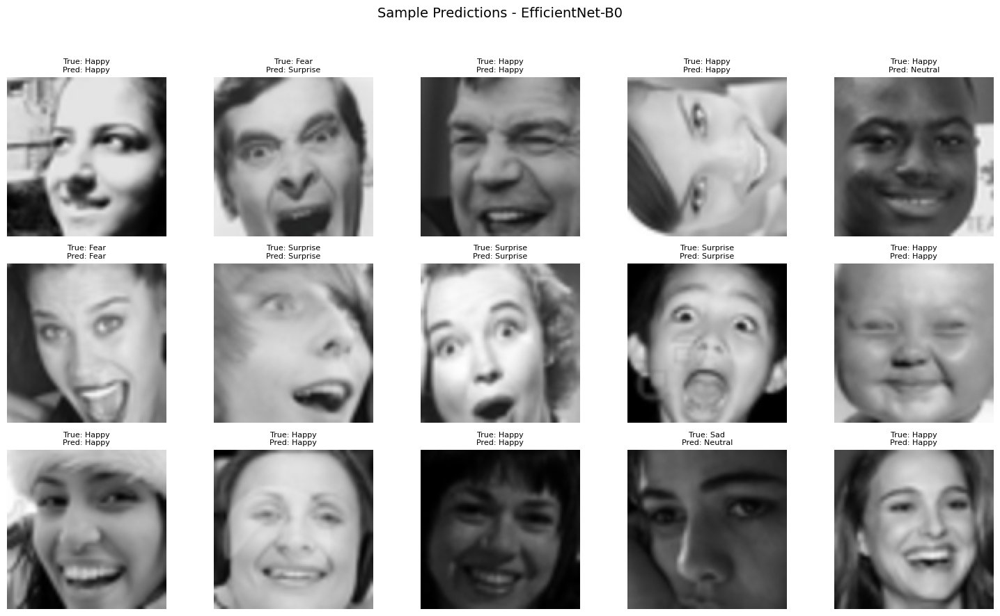

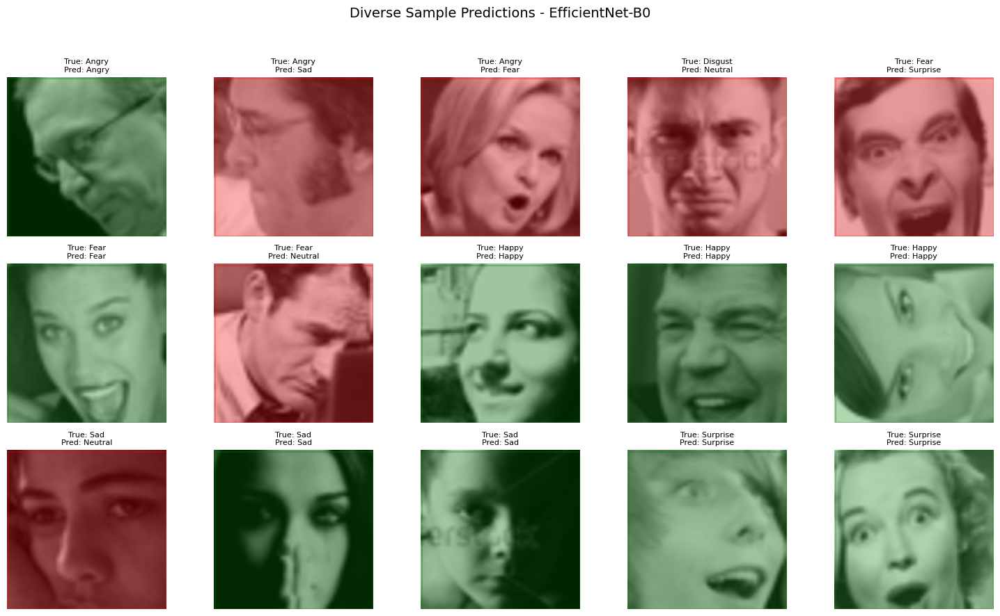


Testing model: ResNet-18


ResNet-18 -> Test Loss: 2.7926  Test Acc: 0.5656  Sklearn Acc: 0.5656

Classification Report:
              precision    recall  f1-score   support

           0     0.4390    0.4793    0.4583       991
           1     0.6667    0.3486    0.4578       109
           2     0.3784    0.4453    0.4092      1024
           3     0.8114    0.7492    0.7791      1798
           4     0.4777    0.4219    0.4480      1216
           5     0.6564    0.7450    0.6979       800
           6     0.5327    0.5121    0.5222      1240

    accuracy                         0.5656      7178
   macro avg     0.5660    0.5288    0.5389      7178
weighted avg     0.5741    0.5656    0.5676      7178

Precision: 0.5741
Accuracy:  0.5656
Recall:    0.5656
F1 Score:  0.5676


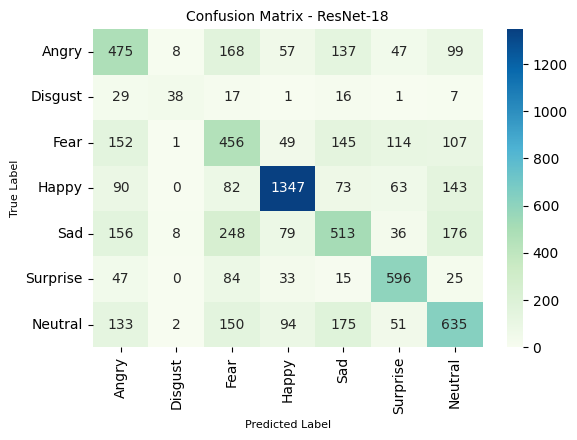

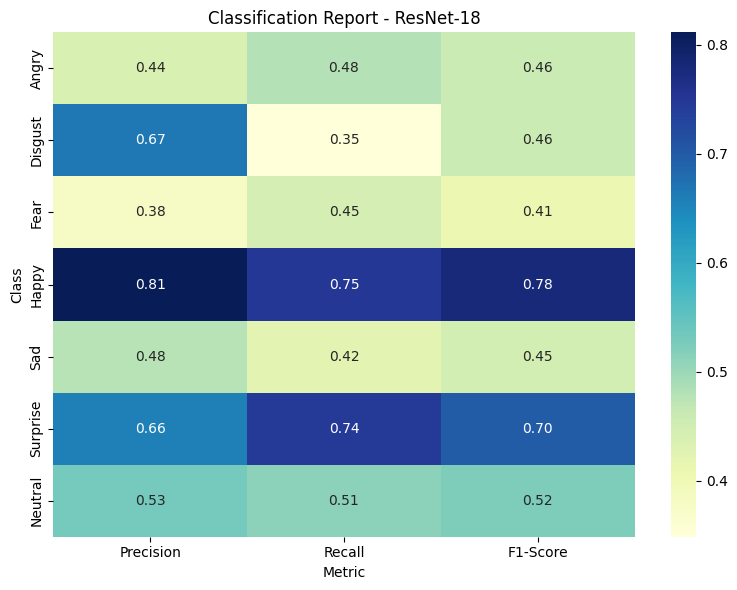

<ipython-input-34-9e06cfba0005>:170: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1_scores, palette="viridis")


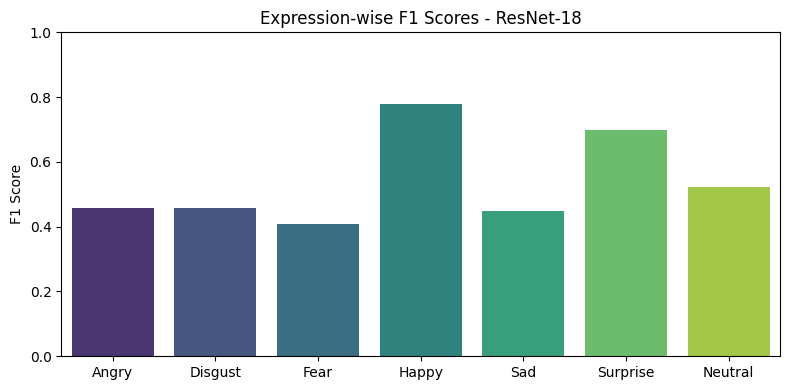

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


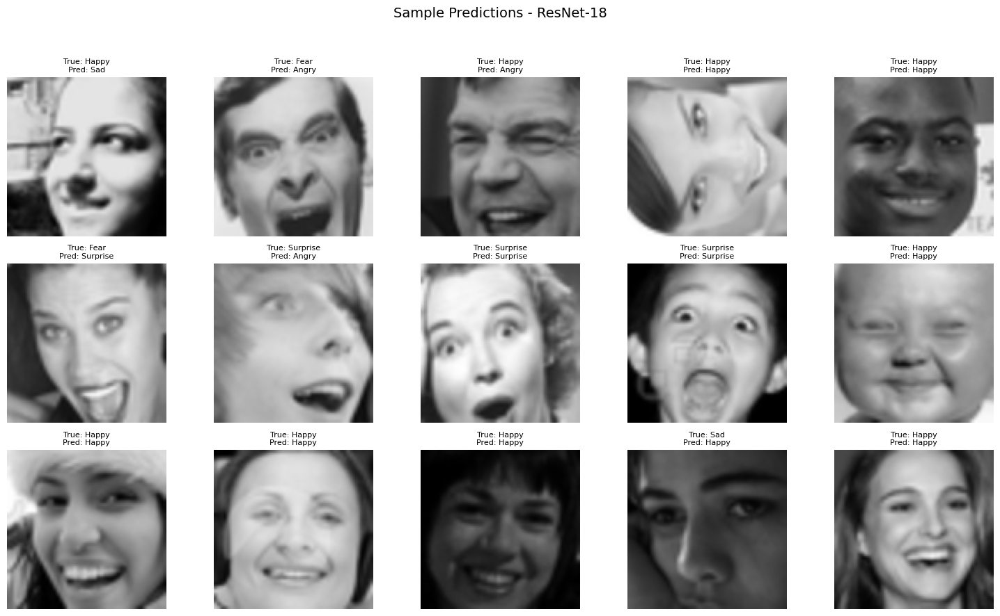

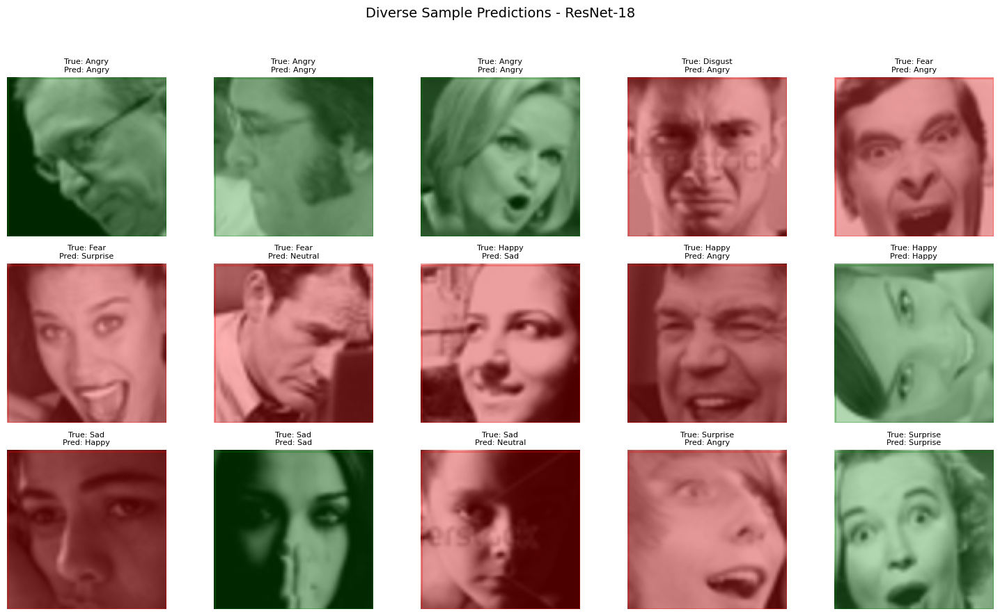

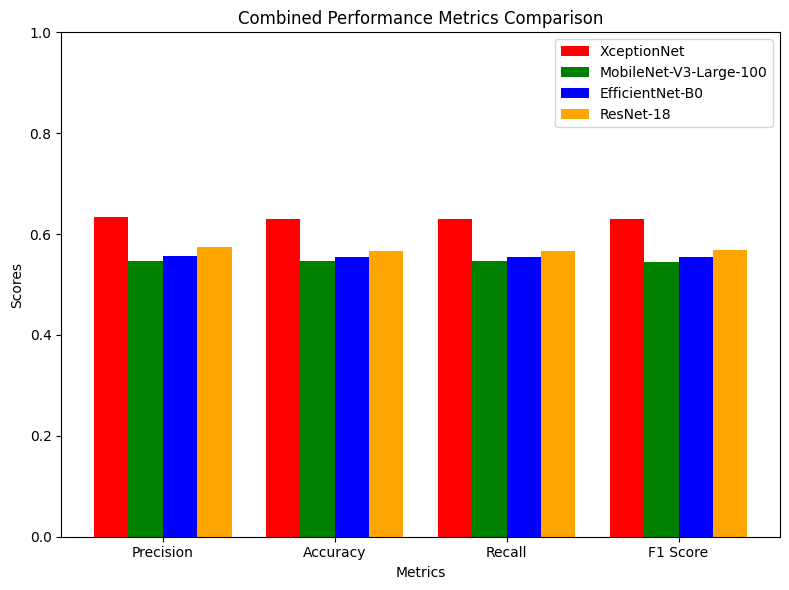

Performance metrics recorded in 'performance_metrics.txt'.


In [ ]:
import torch
import timm
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
import numpy as np
import zipfile

# --------------------------------------------------------
# Assumptions:
# - test_loader: your test dataset loader
# - criterion: your loss function (e.g., nn.CrossEntropyLoss())
# - class_names: list of class names, e.g.,
class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

# - device: device on which to run (e.g., cuda or cpu)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(class_names)

# --------------------------------------------------------
# Initialize models using timm.create_model with pretrained weights and correct model names
xception_model = timm.create_model('xception', pretrained=True, num_classes=num_classes)
mobilenet_model = timm.create_model('mobilenetv3_large_100', pretrained=True, num_classes=num_classes)
efficientnet_model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=num_classes)
resnet_model = timm.create_model('resnet18', pretrained=True, num_classes=num_classes)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Dictionary mapping model names to their file paths and instances
models_info = {
    "XceptionNet": {
        "path": "/content/xception.pth",
        "model": xception_model
    },
    "MobileNet-V3-Large-100": {
        "path": "/content/mobilenet.pth",
        "model": mobilenet_model
    },
    "EfficientNet-B0": {
        "path": "/content/efficientnet.pth",
        "model": efficientnet_model
    },
    "ResNet-18": {
        "path": "/content/resnet.pth",
        "model": resnet_model
    }
}

output_zip_path = "/content/7class_with_hybridsampling_8989_focal_loss.zip"
with zipfile.ZipFile(output_zip_path, "w") as zipf:
    for model_name, info in models_info.items():
        file_path = info["path"]
        # Zip the model file with a customized archive name:
        zipf.write(file_path, arcname=f"{model_name}.pth")

print(f"Zipped: {output_zip_path}")

# Dictionary to store performance metrics for each model
model_metrics = {}

# --------------------------------------------------------
# Helper function: denormalize an image for display
# --------------------------------------------------------
def denormalize(img, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
    # img is assumed to be a torch tensor of shape (C, H, W)
    img = img.clone()  # avoid modifying the original
    for t, m, s in zip(img, mean, std):
        t.mul_(s).add_(m)
    return img

# --------------------------------------------------------
# Loop through each model to test, record metrics, and display sample predictions
# --------------------------------------------------------
for model_name, info in models_info.items():
    print(f"\nTesting model: {model_name}")
    model = info["model"]
    model.load_state_dict(torch.load(info["path"], map_location=device))
    model.to(device)
    model.eval()

    test_loss = 0.0
    total_test = 0
    correct_test = 0
    all_preds = []
    all_labels = []

    test_bar = tqdm(test_loader, desc=f"Testing {model_name}", leave=False)
    with torch.no_grad():
        for images, labels in test_bar:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            test_loss += loss.item() * images.size(0)

            _, predicted = outputs.max(1)
            total_test += labels.size(0)
            correct_test += predicted.eq(labels).sum().item()

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            test_bar.set_postfix(loss=f"{loss.item():.4f}")

    test_loss /= total_test
    test_acc = correct_test / total_test
    sklearn_acc = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')

    print(f"{model_name} -> Test Loss: {test_loss:.4f}  Test Acc: {test_acc:.4f}  Sklearn Acc: {sklearn_acc:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, digits=4))
    print(f"Precision: {precision:.4f}")
    print(f"Accuracy:  {sklearn_acc:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1 Score:  {f1:.4f}")

    # Save overall metrics for combined plot later
    model_metrics[model_name] = {
        "Precision": precision,
        "Accuracy": sklearn_acc,
        "Recall": recall,
        "F1 Score": f1
    }

    # -------------------------------
    # Plot Confusion Matrix
    # -------------------------------
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(6, 4.5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="GnBu",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label", fontsize=8)
    plt.ylabel("True Label", fontsize=8)
    plt.title(f"Confusion Matrix - {model_name}", fontsize=10)
    plt.tight_layout()
    plt.show()
    plt.close()

    # -------------------------------
    # Plot Colored Classification Report (Heatmap)
    # -------------------------------
    # Get the classification report as a dict
    cls_report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)
    # Remove 'accuracy', 'macro avg', 'weighted avg' rows for clarity if needed
    cls_report_filtered = {k: v for k, v in cls_report.items() if k in class_names}

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        np.array([list(cls_report_filtered[c].values())[:-1] for c in class_names]),  # drop support column
        annot=True, fmt=".2f", cmap="YlGnBu",
        xticklabels=['Precision', 'Recall', 'F1-Score'], yticklabels=class_names
    )
    plt.title(f"Classification Report - {model_name}", fontsize=12)
    plt.ylabel("Class")
    plt.xlabel("Metric")
    plt.tight_layout()
    plt.show()
    plt.close()

    # -------------------------------
    # Plot Expression-wise Performance (e.g., F1 Scores per Expression)
    # -------------------------------
    # Here we use the per-class F1 score from the classification report
    f1_scores = [cls_report_filtered[c]['f1-score'] for c in class_names]
    plt.figure(figsize=(8, 4))
    sns.barplot(x=class_names, y=f1_scores, palette="viridis")
    plt.title(f"Expression-wise F1 Scores - {model_name}", fontsize=12)
    plt.ylabel("F1 Score")
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.show()
    plt.close()

    # -------------------------------
    # Display Sample Predictions (Expanded to 15 Images in a 3x5 Grid)
    # -------------------------------
    # Get one batch from the test loader
    sample_images, sample_labels = next(iter(test_loader))
    # Take 15 images (if available)
    sample_images = sample_images[:15]
    sample_labels = sample_labels[:15]

    with torch.no_grad():
        outputs = model(sample_images.to(device))
        _, preds = outputs.max(1)
    preds = preds.cpu().numpy()
    sample_labels = sample_labels.cpu().numpy()

    fig, axes = plt.subplots(3, 5, figsize=(15, 9))
    axes = axes.flatten()
    for i in range(15):
        image = denormalize(sample_images[i])
        image = image.cpu().numpy().transpose(1, 2, 0)
        image = np.clip(image, 0, 1)
        axes[i].imshow(image)
        axes[i].axis('off')
        true_label = class_names[sample_labels[i]]
        pred_label = class_names[preds[i]]
        axes[i].set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=8)
    plt.suptitle(f"Sample Predictions - {model_name}", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    plt.close()

    # -------------------------------
    # Display Diverse Sample Predictions (3x5 Grid with Colored Overlays)
    # -------------------------------
    # We want to sample examples across all classes for diversity.
    diverse_samples = {i: [] for i in range(num_classes)}  # dictionary for each class (0 to 6)
    desired_per_class = 3  # try to get up to 3 images per class if possible

    # Iterate through the test_loader until we have at least 15 samples in total.
    for images, labels in test_loader:
        images = images.to(device)
        with torch.no_grad():
            outputs = model(images)
            _, preds = outputs.max(1)
        # Iterate over the batch and add images to the corresponding class list if not already full
        for i in range(len(labels)):
            label = labels[i].item()
            if len(diverse_samples[label]) < desired_per_class:
                diverse_samples[label].append((images[i].cpu(), label, preds[i].cpu().item()))
        # Stop once we have at least 15 samples total
        total_samples = sum(len(v) for v in diverse_samples.values())
        if total_samples >= 15:
            break

    # Gather all samples and then take only the first 15 examples
    diverse_list = []
    for class_idx in sorted(diverse_samples.keys()):
        diverse_list.extend(diverse_samples[class_idx])
    diverse_list = diverse_list[:15]

    # Plot the selected 15 diverse images in a 3x5 grid
    fig, axes = plt.subplots(3, 5, figsize=(15, 9))
    axes = axes.flatten()
    for idx, (img, true_label, pred_label) in enumerate(diverse_list):
        # Denormalize and prepare the image for display
        image = denormalize(img)
        image = image.numpy().transpose(1, 2, 0)
        image = np.clip(image, 0, 1)

        # Show the image
        axes[idx].imshow(image)
        axes[idx].axis('off')

        # Set the title
        axes[idx].set_title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}", fontsize=8)

        # Determine overlay color: green if correct, red if incorrect
        overlay_color = 'green' if true_label == pred_label else 'red'
        # Create a rectangle patch that covers the whole image
        rect = patches.Rectangle(
            (0, 0), image.shape[1], image.shape[0],
            linewidth=3, edgecolor=overlay_color, facecolor=overlay_color, alpha=0.3
        )
        axes[idx].add_patch(rect)

    # If fewer than 15 images were collected, hide any extra subplots.
    for j in range(idx + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Diverse Sample Predictions - {model_name}", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    plt.close()

# --------------------------------------------------------
# Combined Performance Metrics Plot (Grouped Bar Chart)
# --------------------------------------------------------
metrics_names = ["Precision", "Accuracy", "Recall", "F1 Score"]
n_groups = len(metrics_names)
index = np.arange(n_groups)
bar_width = 0.2

colors = ['red', 'green', 'blue', 'orange']

plt.figure(figsize=(8, 6))
for i, (model_name, metrics_dict) in enumerate(model_metrics.items()):
    values = [metrics_dict[m] for m in metrics_names]
    plt.bar(index + i * bar_width, values, bar_width, label=model_name, color=colors[i])

plt.xlabel("Metrics")
plt.ylabel("Scores")
plt.title("Combined Performance Metrics Comparison")
plt.xticks(index + bar_width * (len(model_metrics) - 1) / 2, metrics_names)
plt.ylim(0, 1)
plt.legend()
plt.tight_layout()
plt.show()
plt.close()

# --------------------------------------------------------
# Write the metrics to a text file
# --------------------------------------------------------
with open("performance_metrics.txt", "w") as f:
    f.write("Model Name - Precision - Accuracy - Recall - F1 Score\n")
    for model_name, metrics_dict in model_metrics.items():
        f.write(f"{model_name} - {metrics_dict['Precision']:.4f} - {metrics_dict['Accuracy']:.4f} - {metrics_dict['Recall']:.4f} - {metrics_dict['F1 Score']:.4f}\n")

print("Performance metrics recorded in 'performance_metrics.txt'.")


## LIME XAI

/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name xception to current legacy_xception.
  model = create_fn(


  0%|          | 0/1000 [00:00<?, ?it/s]

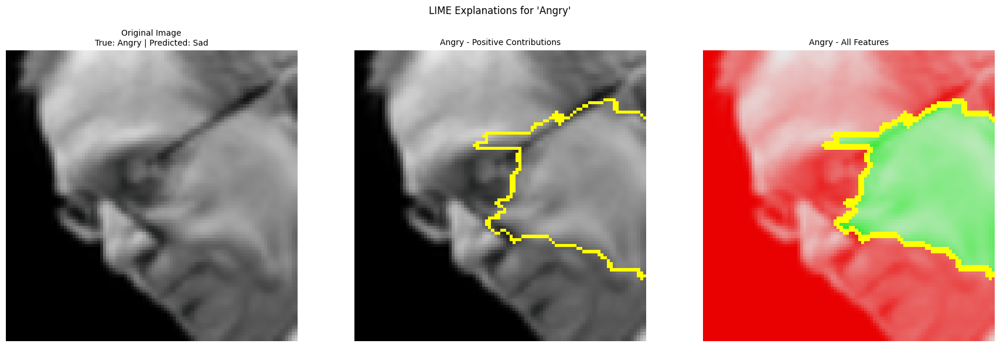

  0%|          | 0/1000 [00:00<?, ?it/s]

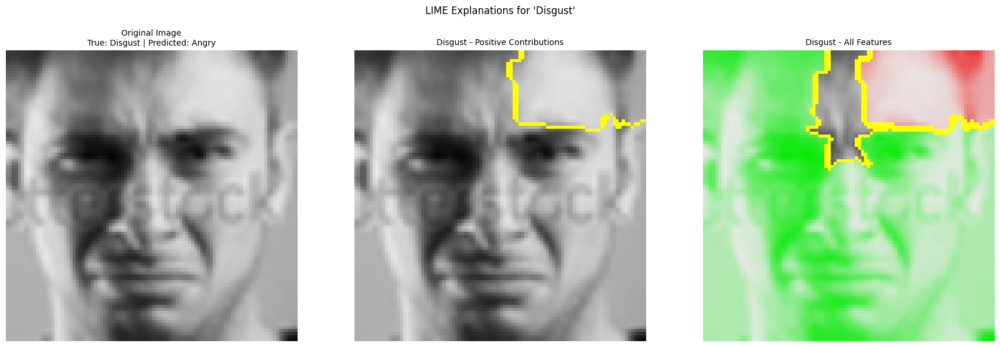

  0%|          | 0/1000 [00:00<?, ?it/s]

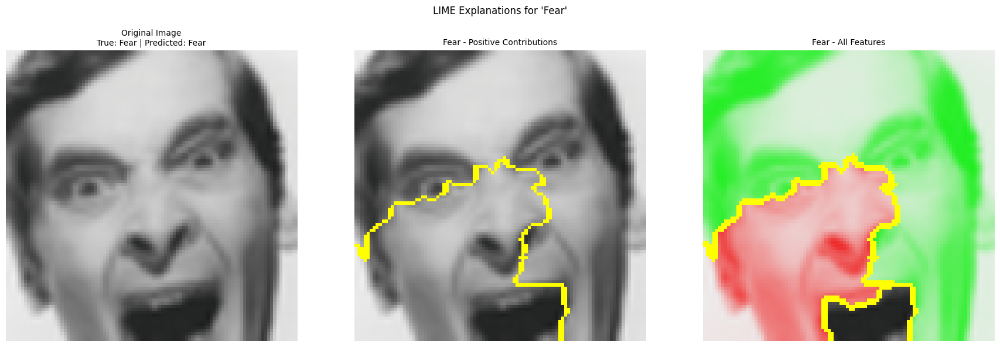

  0%|          | 0/1000 [00:00<?, ?it/s]

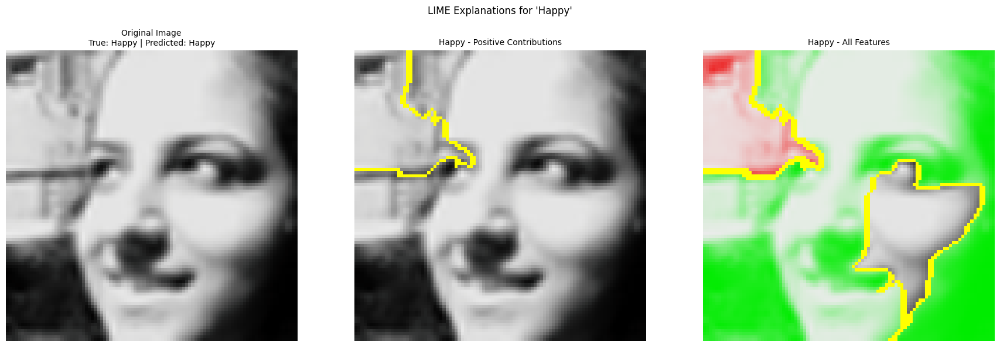

  0%|          | 0/1000 [00:00<?, ?it/s]

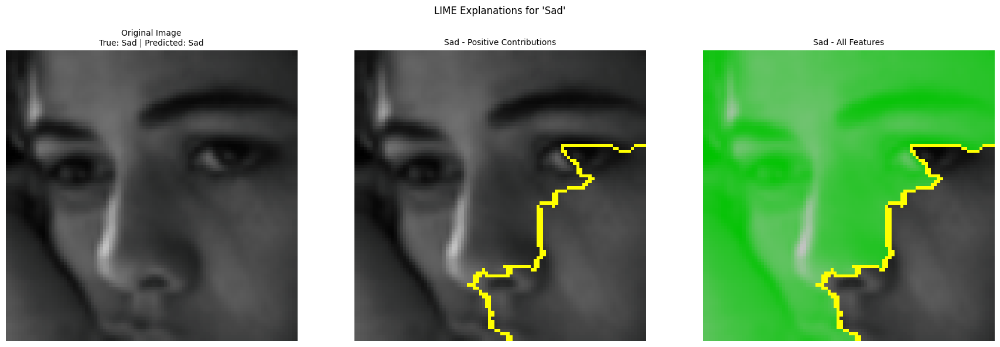

  0%|          | 0/1000 [00:00<?, ?it/s]

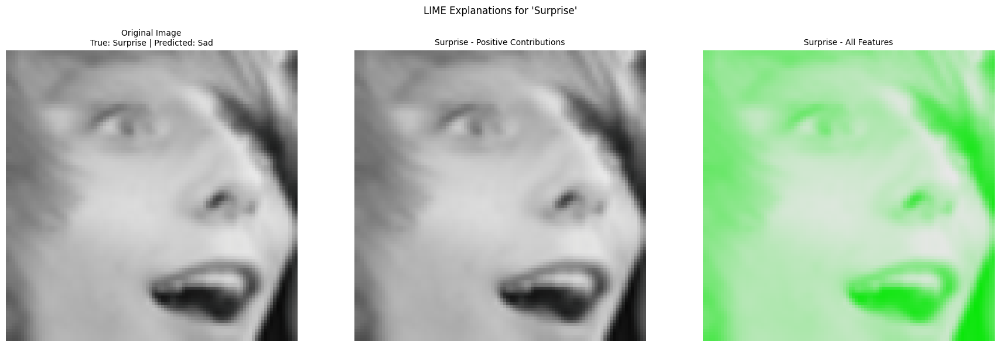

  0%|          | 0/1000 [00:00<?, ?it/s]

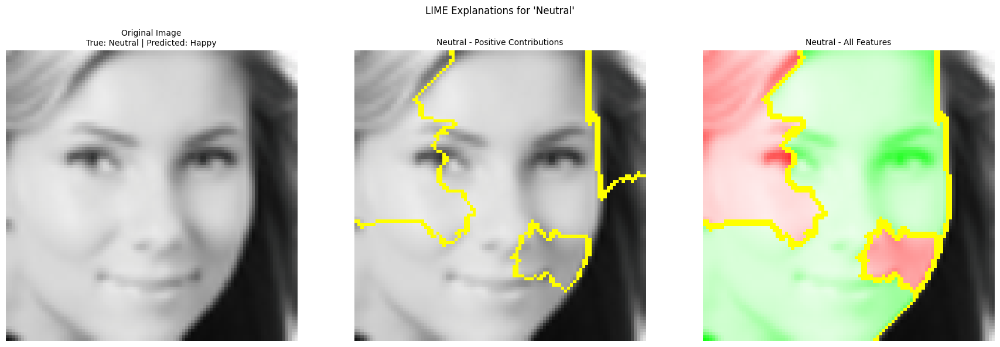

In [ ]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage
import numpy as np
import torch
import timm
from torchvision import transforms
from torchvision.transforms import functional as TF

# --------------------------------------------------------
# Project Parameters and Model Loading
# --------------------------------------------------------
class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
num_classes = len(class_names)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Example: using the 'xception' model; update model_path as needed.
model = timm.create_model('xception', pretrained=True, num_classes=num_classes)
model_path = "/content/xception.pth"  # Update this with your weights path
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# --------------------------------------------------------
# Transformations (should match the training preprocessing)
# --------------------------------------------------------
# For model input (normalized)
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize([128, 128]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Denormalization function to revert the normalization (for display purposes)
def denormalize(img_tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    img = img_tensor.clone()
    for c, m, s in zip(range(img.shape[0]), mean, std):
        img[c] = img[c] * s + m
    return img

# --------------------------------------------------------
# Batch Prediction Function for LIME
# --------------------------------------------------------
def batch_predict(images):
    """
    Accepts a list of PIL images, applies the transform,
    and returns the model's prediction probabilities as a numpy array.
    """
    model.eval()
    batch = []
    for img in images:
        # Use the same transformation as for model input
        img_tensor = transform(np.array(img))
        batch.append(img_tensor)
    batch = torch.stack(batch, dim=0).to(device)
    with torch.no_grad():
        logits = model(batch)
        probs = torch.softmax(logits, dim=1)
    return probs.cpu().numpy()

# --------------------------------------------------------
# Select a Sample for Each Class from the Test Loader
# --------------------------------------------------------
# Assume test_loader is defined and provides batches of images and labels.
# We iterate through test_loader to collect one sample per class based on the actual (true) label.
samples = {}  # Dictionary mapping class index to (image_tensor, label)
for images, labels in test_loader:
    for i in range(len(labels)):
        label = labels[i].item()
        if label not in samples:
            samples[label] = (images[i].cpu(), labels[i].cpu())
        if len(samples) == num_classes:
            break
    if len(samples) == num_classes:
        break

# Convert tensor image to PIL image using ToPILImage, after denormalizing for correct display.
to_pil = ToPILImage()

# --------------------------------------------------------
# For Each Class, Generate LIME Explanations and Display the Original Image
# --------------------------------------------------------
for cls in range(num_classes):
    # Retrieve the sample image and its true label for this class
    img_tensor, true_label_tensor = samples[cls]
    # Denormalize the image for correct visualization
    orig_tensor = denormalize(img_tensor)
    # Convert to PIL image
    orig_pil_image = to_pil(orig_tensor)
    true_label = class_names[true_label_tensor.item()]

    # Get the model prediction for this sample using the transformed (normalized) image.
    input_tensor = transform(np.array(orig_pil_image)).unsqueeze(0).to(device)
    with torch.no_grad():
        logits = model(input_tensor)
        probs = torch.softmax(logits, dim=1)
        pred_class = torch.argmax(probs, dim=1).item()
    predicted_label = class_names[pred_class]

    # Display a plot with the original image alongside its LIME explanations.
    # Create a new figure with three subplots in one row.
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Subplot 1: Original Image (before any LIME modifications)
    axs[0].imshow(orig_pil_image)
    axs[0].set_title(f"Original Image\nTrue: {true_label} | Predicted: {predicted_label}", fontsize=10)
    axs[0].axis('off')

    # Generate LIME explanation for the sample image.
    explainer = lime_image.LimeImageExplainer()
    np_image = np.array(orig_pil_image)
    explanation = explainer.explain_instance(np_image,
                                             batch_predict,
                                             top_labels=num_classes,
                                             hide_color=0,
                                             num_samples=1000)

    # Subplot 2: LIME Explanation showing only positive contributions
    temp, mask = explanation.get_image_and_mask(cls,
                                                  positive_only=True,
                                                  num_features=7,
                                                  hide_rest=False)
    img_boundary = mark_boundaries(temp / 255.0, mask)
    axs[1].imshow(img_boundary)
    axs[1].set_title(f"{class_names[cls]} - Positive Contributions", fontsize=10)
    axs[1].axis('off')

    # Subplot 3: LIME Explanation showing all features (both positive and negative)
    temp_all, mask_all = explanation.get_image_and_mask(cls,
                                                          positive_only=False,
                                                          num_features=7,
                                                          hide_rest=False)
    img_boundary_all = mark_boundaries(temp_all / 255.0, mask_all)
    axs[2].imshow(img_boundary_all)
    axs[2].set_title(f"{class_names[cls]} - All Features", fontsize=10)
    axs[2].axis('off')

    plt.suptitle(f"LIME Explanations for '{class_names[cls]}'", fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


# AlignedFERDataset with Facenet-MTCNN

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from facenet_pytorch import MTCNN
from PIL import Image
from torchvision.transforms.functional import InterpolationMode
import shutil

import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from facenet_pytorch import MTCNN
from PIL import Image
from torchvision.transforms.functional import InterpolationMode
import shutil
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from facenet_pytorch import MTCNN
from PIL import Image
import shutil

class AlignedFERDataset(Dataset):
    def __init__(self, dataframe, transform=None, exclude_disgust=False,
                 align_dir='aligned_images', device='cuda', batch_size=32,
                 remove_undetected=True):
        self.transform = transform
        self.exclude_disgust = exclude_disgust
        self.align_dir = align_dir
        self.device = device
        self.batch_size = batch_size
        self.remove_undetected = remove_undetected
        data = dataframe.copy()
        if self.exclude_disgust:
            data = data[data['emotion'] != 1].reset_index(drop=True)
            data['emotion'] = data['emotion'].apply(lambda x: x if x == 0 else x - 1)

        data['pixels'] = data['pixels'].apply(
            lambda x: np.array(x.split(" "), dtype=np.float32).reshape((48, 48))
        )

        if os.path.exists(self.align_dir):
            print(f"\nRemoving existing folder: {self.align_dir}")
            shutil.rmtree(self.align_dir)
        os.makedirs(self.align_dir)

        self.mtcnn = MTCNN(
            image_size=96,
            margin=20,
            min_face_size=10,
            keep_all=True,
            post_process=True,
            device=self.device
        )

        total_input_count = len(data)
        not_detected_count = 0
        valid_rows = []
        new_idx = 0

        batch_images = []
        batch_rows = []

        print("Starting face alignment (BATCH MODE)...\n")
        for i, (_, row) in enumerate(tqdm(data.iterrows(), total=total_input_count, desc="Aligning faces")):
            image = row['pixels']
            image_rgb = cv2.cvtColor(np.uint8(image), cv2.COLOR_GRAY2RGB)
            image_pil = Image.fromarray(image_rgb)

            batch_images.append(image_pil)
            batch_rows.append(row)

            if len(batch_images) == batch_size or i == total_input_count - 1:
                with torch.no_grad():
                    aligned_batch = self.mtcnn(batch_images)

                for j, faces in enumerate(aligned_batch):
                    if faces is None or len(faces) == 0:
                        not_detected_count += 1
                        if not self.remove_undetected:
                            # Dummy siyah görüntü kaydet
                            dummy_tensor = torch.zeros((3, 96, 96))  # RGB siyah
                            aligned_face = transforms.ToPILImage()(dummy_tensor)
                            aligned_path = os.path.join(self.align_dir, f"{new_idx}.png")
                            aligned_face.save(aligned_path)

                            valid_rows.append(batch_rows[j])
                            new_idx += 1
                        continue

                    aligned_tensor = faces[0]

                    min_val = aligned_tensor.min()
                    max_val = aligned_tensor.max()
                    range_val = max_val - min_val

                    if range_val > 0:
                        aligned_tensor = (aligned_tensor - min_val) / range_val
                    else:
                        aligned_tensor = torch.zeros_like(aligned_tensor)

                    aligned_face = transforms.ToPILImage()(aligned_tensor.cpu())
                    aligned_path = os.path.join(self.align_dir, f"{new_idx}.png")
                    aligned_face.save(aligned_path)

                    valid_rows.append(batch_rows[j])
                    new_idx += 1

                batch_images = []
                batch_rows = []

        self.data = pd.DataFrame(valid_rows)

        print(f"\nTotal samples        : {total_input_count}")
        print(f"Not detected faces   : {not_detected_count}")
        print(f"Successfully aligned : {len(self.data)}")
        if not self.remove_undetected:
            print("Not detected samples were kept in the dataset (but may not be usable).")

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        aligned_path = os.path.join(self.align_dir, f"{idx}.png")
        image = Image.open(aligned_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        label = int(self.data.iloc[idx]['emotion'])
        return image, label

# Transforms
train_transforms = transforms.Compose([
    transforms.Resize((96, 96)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((96, 96)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# After creating your DataFrames (e.g., train_df, val_df), you can define the datasets as follows:
train_dataset_processed = AlignedFERDataset(train_df_hybrid, transform=train_transforms, remove_undetected=True, exclude_disgust=False, align_dir='aligned_train', device='cuda', batch_size=64)
val_dataset_processed   = AlignedFERDataset(val_df, transform=val_transforms, remove_undetected=True, exclude_disgust=False, align_dir='aligned_val', device='cuda', batch_size=64)
test_dataset_processed  = AlignedFERDataset(test_df, transform=val_transforms, remove_undetected=True, exclude_disgust=False, align_dir='aligned_test', device='cuda', batch_size=64)


Removing existing folder: aligned_train
Starting face alignment (BATCH MODE)...



Aligning faces: 100%|██████████| 62923/62923 [04:57<00:00, 211.72it/s]



Total samples        : 62923
Not detected faces   : 10463
Successfully aligned : 52460

Removing existing folder: aligned_val
Starting face alignment (BATCH MODE)...



Aligning faces: 100%|██████████| 5742/5742 [00:25<00:00, 221.65it/s]



Total samples        : 5742
Not detected faces   : 928
Successfully aligned : 4814

Removing existing folder: aligned_test
Starting face alignment (BATCH MODE)...



Aligning faces: 100%|██████████| 7178/7178 [00:31<00:00, 225.18it/s]


Total samples        : 7178
Not detected faces   : 1188
Successfully aligned : 5990


Creating a 1% subset to test the results of alignment

In [ ]:
# Creating a 1% subset using the pandas sample() function.
# train_subset = train_df_hybrid.sample(frac=0.01, random_state=42)
# val_subset   = val_df.sample(frac=0.01, random_state=42)
# test_subset  = test_df.sample(frac=0.01, random_state=42)

# train_dataset_processed = AlignedFERDataset(train_subset, transform=train_transforms, exclude_disgust=False, align_dir='aligned_train', device='cuda')
# val_dataset_processed   = AlignedFERDataset(val_subset, transform=val_transforms, exclude_disgust=False, align_dir='aligned_val', device='cuda')
# test_dataset_processed  = AlignedFERDataset(test_subset, transform=val_transforms, exclude_disgust=False, align_dir='aligned_test', device='cuda')

Train dataset with face alignment


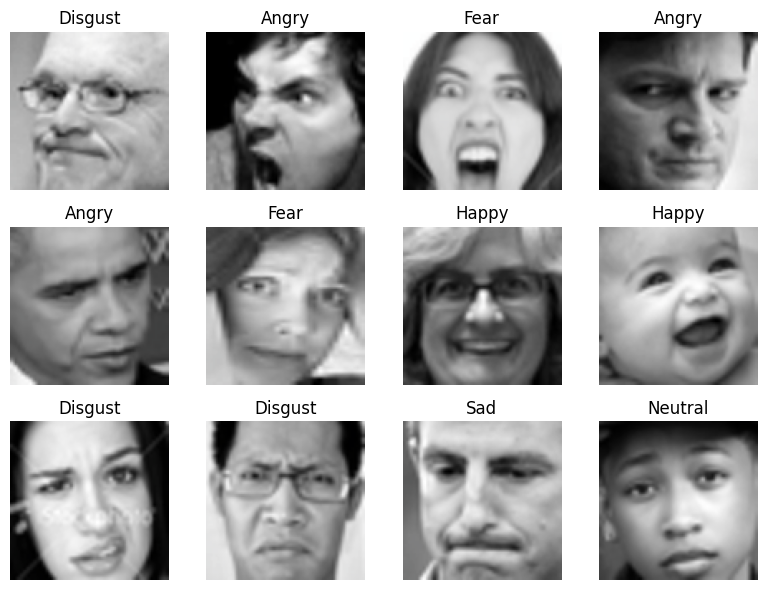


Train dataset without face alignment


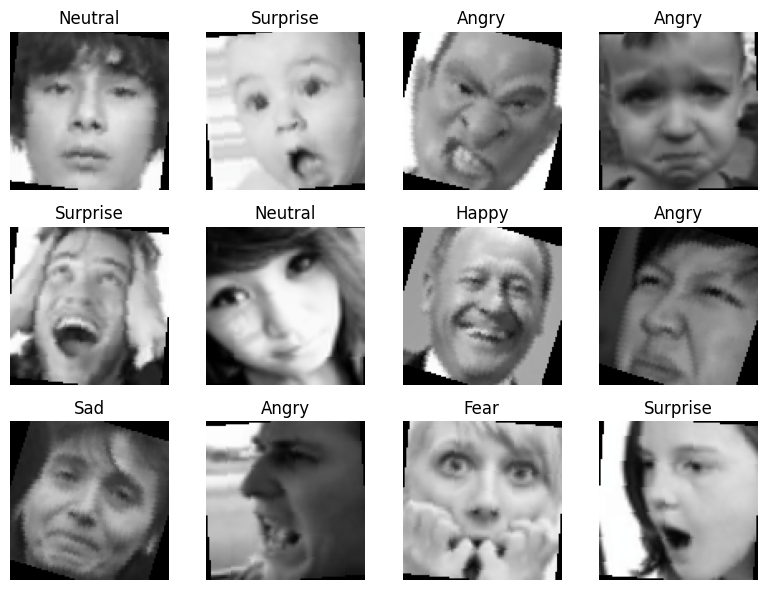

In [ ]:
EMOTION_LABELS = {
    0: "Angry",
    1: "Disgust",
    2: "Fear",
    3: "Happy",
    4: "Sad",
    5: "Surprise",
    6: "Neutral"
}

def denormalize(image_tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    image = image_tensor.permute(1, 2, 0).cpu().numpy()
    image = std * image + mean
    image = np.clip(image, 0, 1)
    return image

def plot_dataset_images_random(dataset, n_images=16, exclude_disgust=False):
    """
    Displays a random selection of n_images images from the dataset with their label names.
    If exclude_disgust=True, the label mapping is adjusted accordingly.
    """
    indices = random.sample(range(len(dataset)), n_images)

    # If disgust is excluded (emotion 1), shift the labels
    label_map = EMOTION_LABELS.copy()
    if exclude_disgust:
        label_map = {
            0: "Angry",
            1: "Fear",
            2: "Happy",
            3: "Sad",
            4: "Surprise",
            5: "Neutral"
        }

    n_cols = int(np.ceil(np.sqrt(n_images)))
    n_rows = int(np.ceil(n_images / n_cols))

    plt.figure(figsize=(n_cols * 2, n_rows * 2))
    for i, idx in enumerate(indices):
        image, label = dataset[idx]
        image = denormalize(image)
        label_str = label_map.get(label, str(label))  # fallback if unexpected label
        plt.subplot(n_rows, n_cols, i+1)
        plt.imshow(image)
        plt.title(f"{label_str}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

print("Train dataset with face alignment")
plot_dataset_images_random(train_dataset_processed, n_images=12)


print("\nTrain dataset without face alignment")
plot_dataset_images_random(train_dataset, n_images=12)


In [ ]:
batch_size=64

from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset_processed, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader   = DataLoader(val_dataset_processed, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)
test_loader  = DataLoader(test_dataset_processed, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('xception', pretrained=True, num_classes=num_classes)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

trained_model = train_model(model, optimizer, criterion, train_loader, val_loader, device, num_epochs=30, model_save_path="/content/xception.pth")

/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name xception to current legacy_xception.
  model = create_fn(


Epoch 1/30  Train Loss: 0.9242  Train Acc: 0.6665  Val Loss: 1.1440  Val Acc: 0.6124


Epoch 2/30  Train Loss: 0.3248  Train Acc: 0.8953  Val Loss: 1.2465  Val Acc: 0.6282


Epoch 3/30  Train Loss: 0.1544  Train Acc: 0.9531  Val Loss: 1.4159  Val Acc: 0.6282


Epoch 4/30  Train Loss: 0.0938  Train Acc: 0.9712  Val Loss: 1.6693  Val Acc: 0.6323


Epoch 5/30  Train Loss: 0.0781  Train Acc: 0.9759  Val Loss: 1.6760  Val Acc: 0.6352


Epoch 6/30  Train Loss: 0.0621  Train Acc: 0.9806  Val Loss: 1.8018  Val Acc: 0.6344


Epoch 7/30  Train Loss: 0.0562  Train Acc: 0.9819  Val Loss: 1.8592  Val Acc: 0.6251


Epoch 8/30  Train Loss: 0.0529  Train Acc: 0.9831  Val Loss: 1.8833  Val Acc: 0.6352


Epoch 9/30  Train Loss: 0.0415  Train Acc: 0.9864  Val Loss: 2.0603  Val Acc: 0.6296


Epoch 10/30  Train Loss: 0.0411  Train Acc: 0.9858  Val Loss: 2.1141  Val Acc: 0.6369


Epoch 11/30  Train Loss: 0.0385  Train Acc: 0.9873  Val Loss: 2.0480  Val Acc: 0.6280


Epoch 12/30  Train Loss: 0.0411  Train Acc: 0.9868  Val Loss: 2.0540  Val Acc: 0.6365


Epoch 13/30  Train Loss: 0.0349  Train Acc: 0.9885  Val Loss: 2.0944  Val Acc: 0.6485


Epoch 14/30  Train Loss: 0.0305  Train Acc: 0.9895  Val Loss: 2.0646  Val Acc: 0.6446


Epoch 15/30  Train Loss: 0.0317  Train Acc: 0.9899  Val Loss: 2.1721  Val Acc: 0.6402


Epoch 16/30  Train Loss: 0.0352  Train Acc: 0.9881  Val Loss: 2.1500  Val Acc: 0.6462


Epoch 17/30  Train Loss: 0.0276  Train Acc: 0.9904  Val Loss: 2.2386  Val Acc: 0.6491


Epoch 18/30  Train Loss: 0.0262  Train Acc: 0.9913  Val Loss: 2.1667  Val Acc: 0.6377


Epoch 19/30  Train Loss: 0.0275  Train Acc: 0.9906  Val Loss: 2.3548  Val Acc: 0.6435


Epoch 20/30  Train Loss: 0.0245  Train Acc: 0.9920  Val Loss: 2.2726  Val Acc: 0.6419


Epoch 21/30  Train Loss: 0.0259  Train Acc: 0.9917  Val Loss: 2.2167  Val Acc: 0.6429


Epoch 22/30  Train Loss: 0.0248  Train Acc: 0.9922  Val Loss: 2.3631  Val Acc: 0.6462


Epoch 23/30  Train Loss: 0.0279  Train Acc: 0.9906  Val Loss: 2.3487  Val Acc: 0.6467


Epoch 24/30  Train Loss: 0.0221  Train Acc: 0.9924  Val Loss: 2.4559  Val Acc: 0.6454


Epoch 25/30  Train Loss: 0.0253  Train Acc: 0.9915  Val Loss: 2.2933  Val Acc: 0.6394


Epoch 26/30  Train Loss: 0.0230  Train Acc: 0.9924  Val Loss: 2.3086  Val Acc: 0.6452


Epoch 27/30  Train Loss: 0.0207  Train Acc: 0.9933  Val Loss: 2.3989  Val Acc: 0.6481


Epoch 28/30  Train Loss: 0.0206  Train Acc: 0.9934  Val Loss: 2.3864  Val Acc: 0.6479


Epoch 29/30  Train Loss: 0.0196  Train Acc: 0.9937  Val Loss: 2.2877  Val Acc: 0.6514


Epoch 30/30  Train Loss: 0.0220  Train Acc: 0.9922  Val Loss: 2.2950  Val Acc: 0.6450


Test Loss: 2.3180  Test Acc: 0.6676  Sklearn Acc: 0.6676

Classification Report:
              precision    recall  f1-score   support

           0     0.5793    0.5594    0.5692       842
           1     0.7170    0.4634    0.5630        82
           2     0.5480    0.4354    0.4853       813
           3     0.8534    0.8644    0.8589      1556
           4     0.5246    0.5434    0.5338       922
           5     0.7460    0.8043    0.7741       690
           6     0.6110    0.6774    0.6425      1085

    accuracy                         0.6676      5990
   macro avg     0.6542    0.6211    0.6324      5990
weighted avg     0.6647    0.6676    0.6644      5990

Precision: 0.6647
Accuracy:  0.6676
Recall:    0.6676
F1 Score:  0.6644


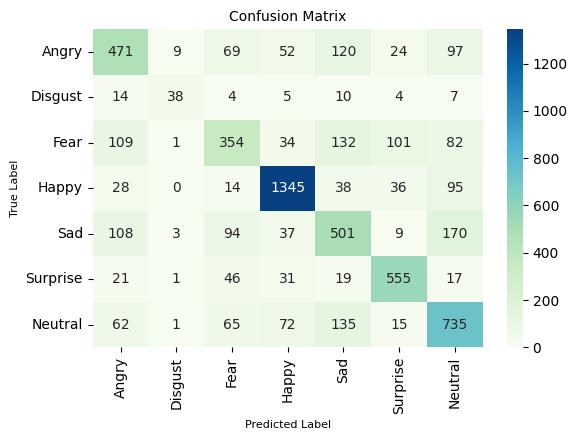

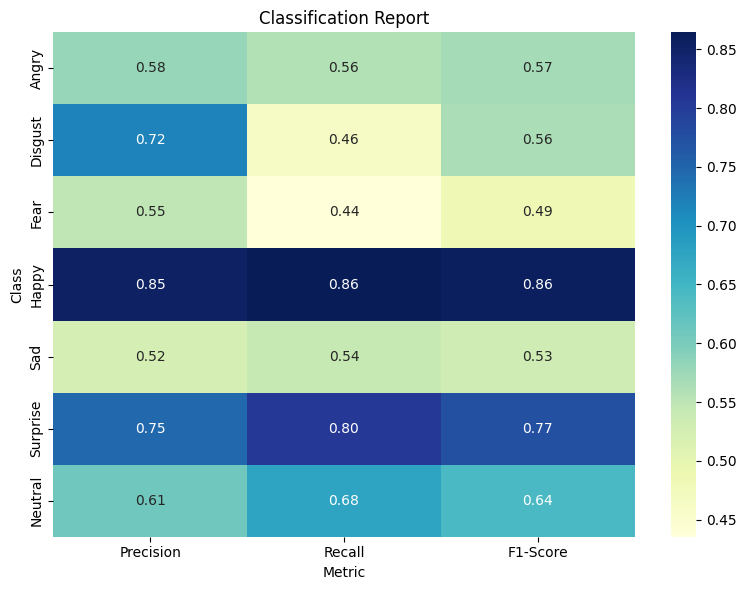

<ipython-input-43-be3cfa3ef64b>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1_scores, palette="viridis")


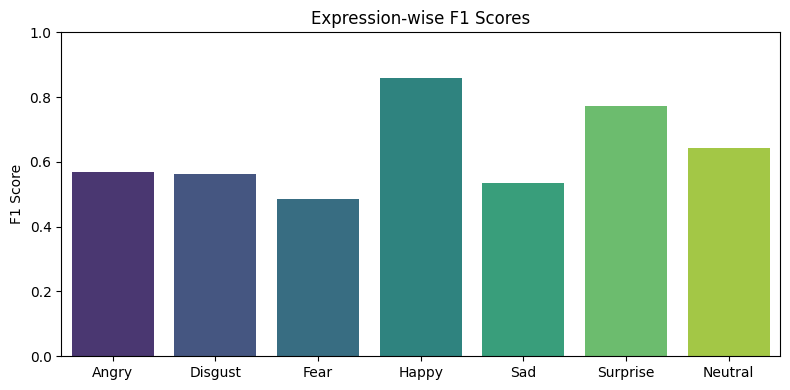

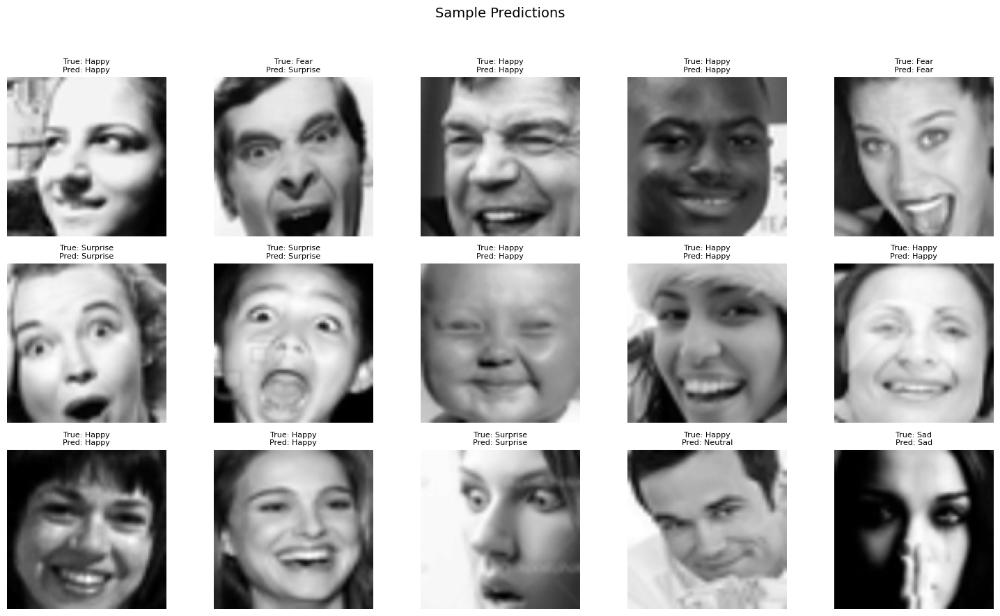

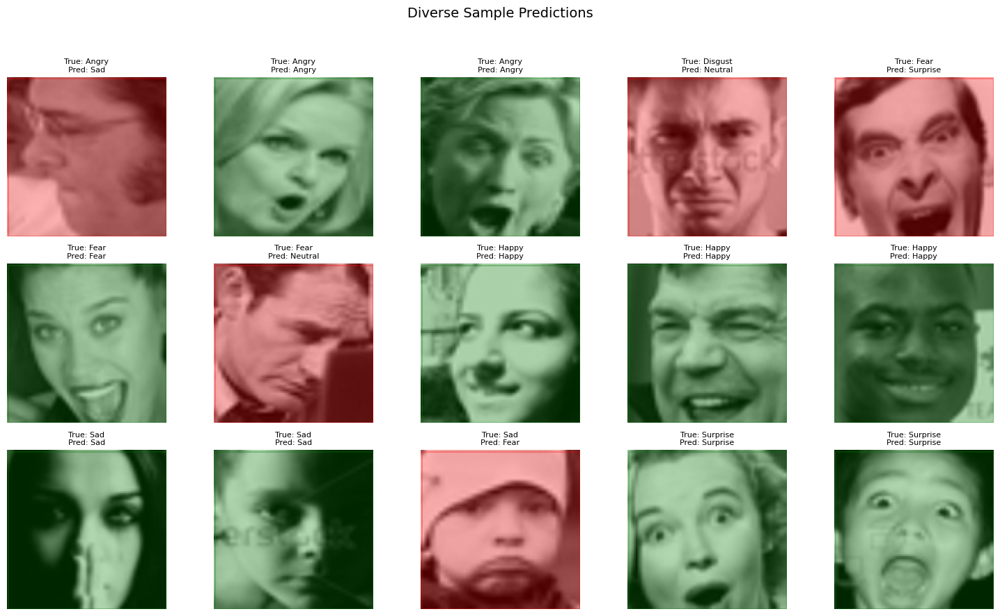

Performance metrics recorded in 'performance_metrics.txt'.


In [ ]:
test_model(model, test_loader, criterion, class_names, device)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('mobilenetv3_large_100', pretrained=True, num_classes=num_classes)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

trained_model = train_model(model, optimizer, criterion, train_loader, val_loader, device, num_epochs=30, model_save_path="/content/mobilenet.pth")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/22.1M [00:00<?, ?B/s]

Epoch 1/30  Train Loss: 1.7075  Train Acc: 0.5095  Val Loss: 1.6659  Val Acc: 0.4495


Epoch 2/30  Train Loss: 0.6870  Train Acc: 0.7664  Val Loss: 1.6505  Val Acc: 0.4898


Epoch 3/30  Train Loss: 0.3792  Train Acc: 0.8777  Val Loss: 1.7232  Val Acc: 0.5108


Epoch 4/30  Train Loss: 0.2190  Train Acc: 0.9357  Val Loss: 1.8514  Val Acc: 0.5262


Epoch 5/30  Train Loss: 0.1376  Train Acc: 0.9615  Val Loss: 1.9220  Val Acc: 0.5376


Epoch 6/30  Train Loss: 0.0923  Train Acc: 0.9740  Val Loss: 2.0527  Val Acc: 0.5337


Epoch 7/30  Train Loss: 0.0725  Train Acc: 0.9800  Val Loss: 2.1619  Val Acc: 0.5368


Epoch 8/30  Train Loss: 0.0556  Train Acc: 0.9844  Val Loss: 2.2346  Val Acc: 0.5463


Epoch 9/30  Train Loss: 0.0502  Train Acc: 0.9861  Val Loss: 2.2647  Val Acc: 0.5469


Epoch 10/30  Train Loss: 0.0443  Train Acc: 0.9872  Val Loss: 2.3324  Val Acc: 0.5615


Epoch 11/30  Train Loss: 0.0406  Train Acc: 0.9878  Val Loss: 2.3656  Val Acc: 0.5584


Epoch 12/30  Train Loss: 0.0368  Train Acc: 0.9887  Val Loss: 2.3811  Val Acc: 0.5629


Epoch 13/30  Train Loss: 0.0325  Train Acc: 0.9904  Val Loss: 2.4596  Val Acc: 0.5613


Epoch 14/30  Train Loss: 0.0297  Train Acc: 0.9914  Val Loss: 2.4331  Val Acc: 0.5621


Epoch 15/30  Train Loss: 0.0271  Train Acc: 0.9915  Val Loss: 2.5215  Val Acc: 0.5571


Epoch 16/30  Train Loss: 0.0261  Train Acc: 0.9920  Val Loss: 2.6175  Val Acc: 0.5598


Epoch 17/30  Train Loss: 0.0258  Train Acc: 0.9920  Val Loss: 2.5690  Val Acc: 0.5598


Epoch 18/30  Train Loss: 0.0253  Train Acc: 0.9918  Val Loss: 2.5879  Val Acc: 0.5640


Epoch 19/30  Train Loss: 0.0252  Train Acc: 0.9923  Val Loss: 2.6306  Val Acc: 0.5582


Epoch 20/30  Train Loss: 0.0206  Train Acc: 0.9937  Val Loss: 2.6527  Val Acc: 0.5619


Epoch 21/30  Train Loss: 0.0242  Train Acc: 0.9919  Val Loss: 2.7150  Val Acc: 0.5573


Epoch 22/30  Train Loss: 0.0193  Train Acc: 0.9939  Val Loss: 2.6996  Val Acc: 0.5661


Epoch 23/30  Train Loss: 0.0208  Train Acc: 0.9937  Val Loss: 2.7131  Val Acc: 0.5706


Epoch 24/30  Train Loss: 0.0170  Train Acc: 0.9944  Val Loss: 2.6799  Val Acc: 0.5787


Epoch 25/30  Train Loss: 0.0173  Train Acc: 0.9942  Val Loss: 2.7518  Val Acc: 0.5814


Epoch 26/30  Train Loss: 0.0197  Train Acc: 0.9934  Val Loss: 2.7158  Val Acc: 0.5679


Epoch 27/30  Train Loss: 0.0171  Train Acc: 0.9948  Val Loss: 2.6789  Val Acc: 0.5804


Epoch 28/30  Train Loss: 0.0158  Train Acc: 0.9952  Val Loss: 2.7850  Val Acc: 0.5740


Epoch 29/30  Train Loss: 0.0167  Train Acc: 0.9944  Val Loss: 2.8096  Val Acc: 0.5823


Epoch 30/30  Train Loss: 0.0155  Train Acc: 0.9949  Val Loss: 2.8153  Val Acc: 0.5737


Test Loss: 2.6987  Test Acc: 0.5920  Sklearn Acc: 0.5920

Classification Report:
              precision    recall  f1-score   support

           0     0.5050    0.4774    0.4908       842
           1     0.5965    0.4146    0.4892        82
           2     0.4306    0.4539    0.4419       813
           3     0.8301    0.7789    0.8037      1556
           4     0.4337    0.4610    0.4469       922
           5     0.6920    0.7913    0.7383       690
           6     0.5309    0.5143    0.5225      1085

    accuracy                         0.5920      5990
   macro avg     0.5741    0.5559    0.5619      5990
weighted avg     0.5959    0.5920    0.5929      5990

Precision: 0.5959
Accuracy:  0.5920
Recall:    0.5920
F1 Score:  0.5929


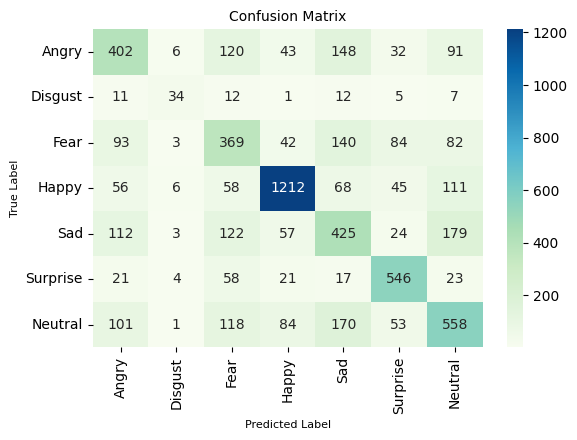

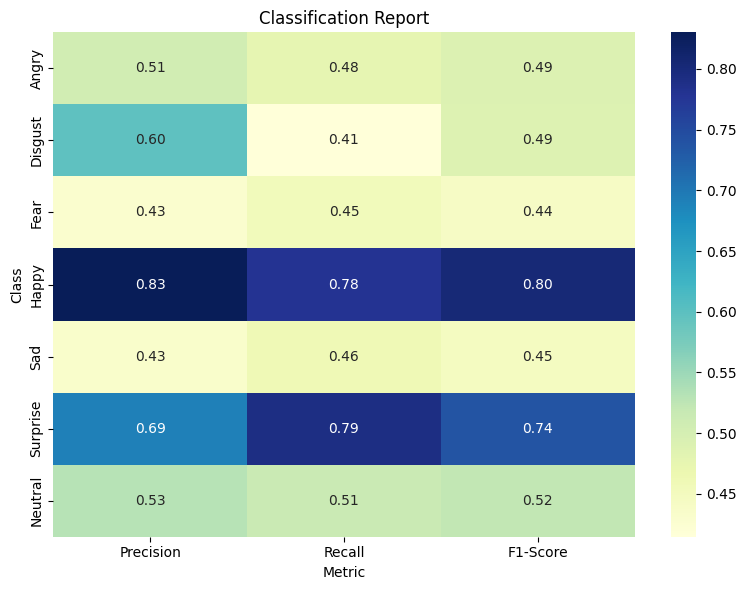

<ipython-input-43-be3cfa3ef64b>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1_scores, palette="viridis")


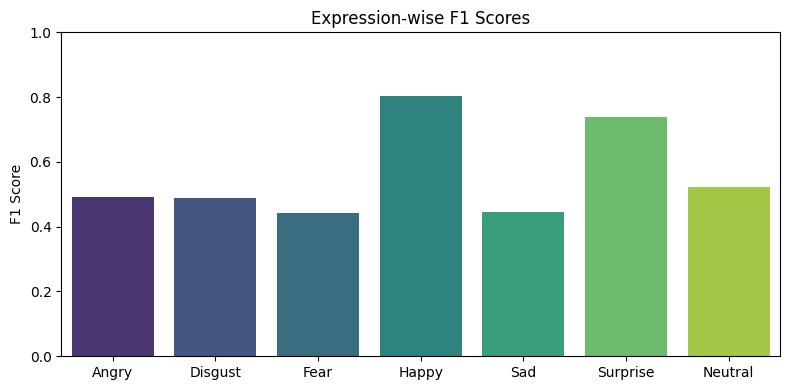

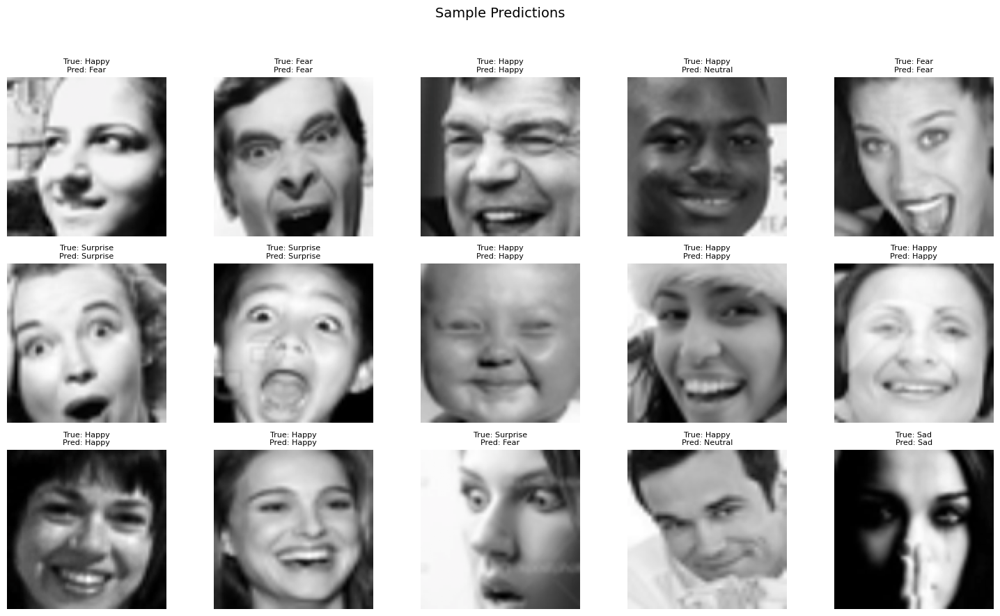

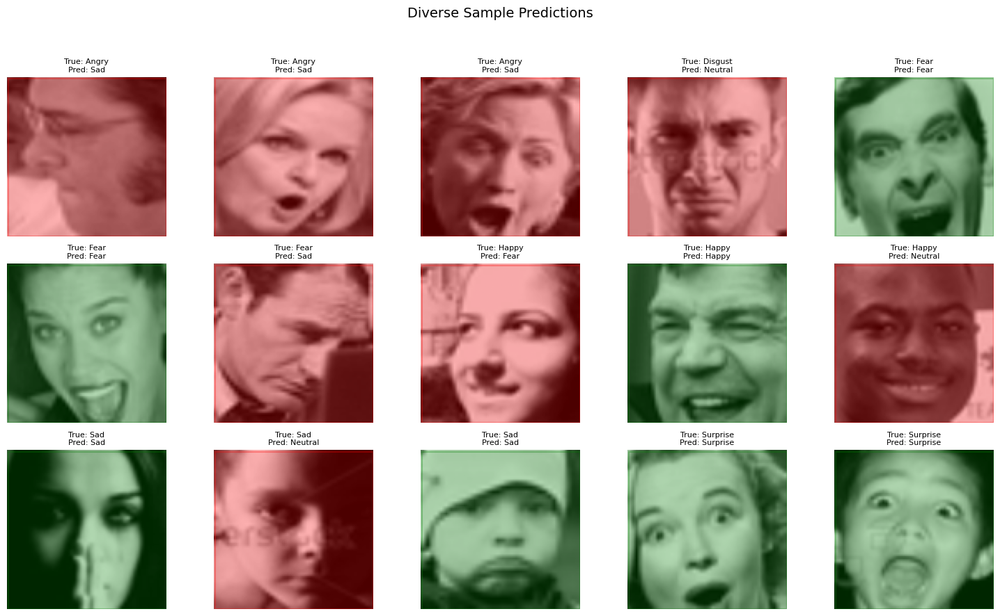

Performance metrics recorded in 'performance_metrics.txt'.


In [ ]:
test_model(model, test_loader, criterion, class_names, device)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=num_classes)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

trained_model = train_model(model, optimizer, criterion, train_loader, val_loader, device, num_epochs=30, model_save_path="/content/efficientnet.pth")

model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

Epoch 1/30  Train Loss: 1.7546  Train Acc: 0.5465  Val Loss: 1.7964  Val Acc: 0.4578


Epoch 2/30  Train Loss: 0.5574  Train Acc: 0.8197  Val Loss: 1.7691  Val Acc: 0.5081


Epoch 3/30  Train Loss: 0.2748  Train Acc: 0.9164  Val Loss: 1.8619  Val Acc: 0.5243


Epoch 4/30  Train Loss: 0.1535  Train Acc: 0.9554  Val Loss: 1.9794  Val Acc: 0.5359


Epoch 5/30  Train Loss: 0.1004  Train Acc: 0.9724  Val Loss: 2.0327  Val Acc: 0.5469


Epoch 6/30  Train Loss: 0.0767  Train Acc: 0.9791  Val Loss: 2.1210  Val Acc: 0.5430


Epoch 7/30  Train Loss: 0.0634  Train Acc: 0.9823  Val Loss: 2.1828  Val Acc: 0.5557


Epoch 8/30  Train Loss: 0.0561  Train Acc: 0.9840  Val Loss: 2.2028  Val Acc: 0.5488


Epoch 9/30  Train Loss: 0.0501  Train Acc: 0.9858  Val Loss: 2.3306  Val Acc: 0.5648


Epoch 10/30  Train Loss: 0.0473  Train Acc: 0.9853  Val Loss: 2.2853  Val Acc: 0.5584


Epoch 11/30  Train Loss: 0.0385  Train Acc: 0.9890  Val Loss: 2.3506  Val Acc: 0.5686


Epoch 12/30  Train Loss: 0.0376  Train Acc: 0.9888  Val Loss: 2.4259  Val Acc: 0.5733


Epoch 13/30  Train Loss: 0.0348  Train Acc: 0.9893  Val Loss: 2.4052  Val Acc: 0.5710


Epoch 14/30  Train Loss: 0.0341  Train Acc: 0.9896  Val Loss: 2.4535  Val Acc: 0.5787


Epoch 15/30  Train Loss: 0.0305  Train Acc: 0.9902  Val Loss: 2.4555  Val Acc: 0.5827


Epoch 16/30  Train Loss: 0.0268  Train Acc: 0.9917  Val Loss: 2.4731  Val Acc: 0.5939


Epoch 17/30  Train Loss: 0.0275  Train Acc: 0.9914  Val Loss: 2.5486  Val Acc: 0.5760


Epoch 18/30  Train Loss: 0.0301  Train Acc: 0.9904  Val Loss: 2.4942  Val Acc: 0.5821


Epoch 19/30  Train Loss: 0.0260  Train Acc: 0.9918  Val Loss: 2.5910  Val Acc: 0.5845


Epoch 20/30  Train Loss: 0.0242  Train Acc: 0.9922  Val Loss: 2.5611  Val Acc: 0.5978


Epoch 21/30  Train Loss: 0.0222  Train Acc: 0.9928  Val Loss: 2.5897  Val Acc: 0.5945


Epoch 22/30  Train Loss: 0.0202  Train Acc: 0.9936  Val Loss: 2.6985  Val Acc: 0.5875


Epoch 23/30  Train Loss: 0.0253  Train Acc: 0.9921  Val Loss: 2.6963  Val Acc: 0.5937


Epoch 24/30  Train Loss: 0.0242  Train Acc: 0.9923  Val Loss: 2.7447  Val Acc: 0.5798


Epoch 25/30  Train Loss: 0.0211  Train Acc: 0.9931  Val Loss: 2.7487  Val Acc: 0.5972


Epoch 26/30  Train Loss: 0.0175  Train Acc: 0.9940  Val Loss: 2.6681  Val Acc: 0.5951


Epoch 27/30  Train Loss: 0.0166  Train Acc: 0.9948  Val Loss: 2.7438  Val Acc: 0.5870


Epoch 28/30  Train Loss: 0.0201  Train Acc: 0.9935  Val Loss: 2.8174  Val Acc: 0.5970


Epoch 29/30  Train Loss: 0.0214  Train Acc: 0.9927  Val Loss: 2.7481  Val Acc: 0.6030


Epoch 30/30  Train Loss: 0.0188  Train Acc: 0.9939  Val Loss: 2.8152  Val Acc: 0.5999


Test Loss: 2.6507  Test Acc: 0.6070  Sklearn Acc: 0.6070

Classification Report:
              precision    recall  f1-score   support

           0     0.4797    0.5059    0.4925       842
           1     0.4706    0.4878    0.4790        82
           2     0.5023    0.4108    0.4520       813
           3     0.8468    0.7924    0.8187      1556
           4     0.4578    0.4534    0.4556       922
           5     0.7377    0.7580    0.7477       690
           6     0.5196    0.6101    0.5613      1085

    accuracy                         0.6070      5990
   macro avg     0.5735    0.5741    0.5724      5990
weighted avg     0.6116    0.6070    0.6077      5990

Precision: 0.6116
Accuracy:  0.6070
Recall:    0.6070
F1 Score:  0.6077


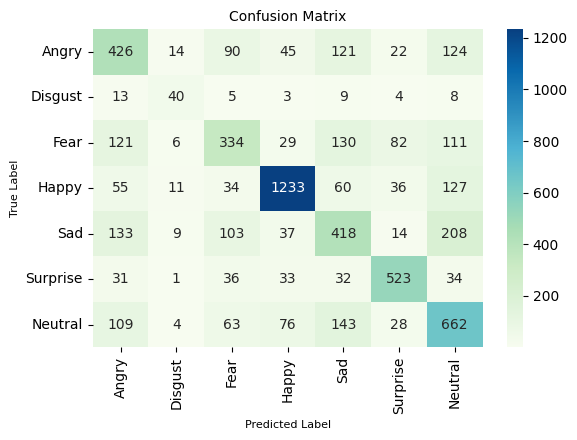

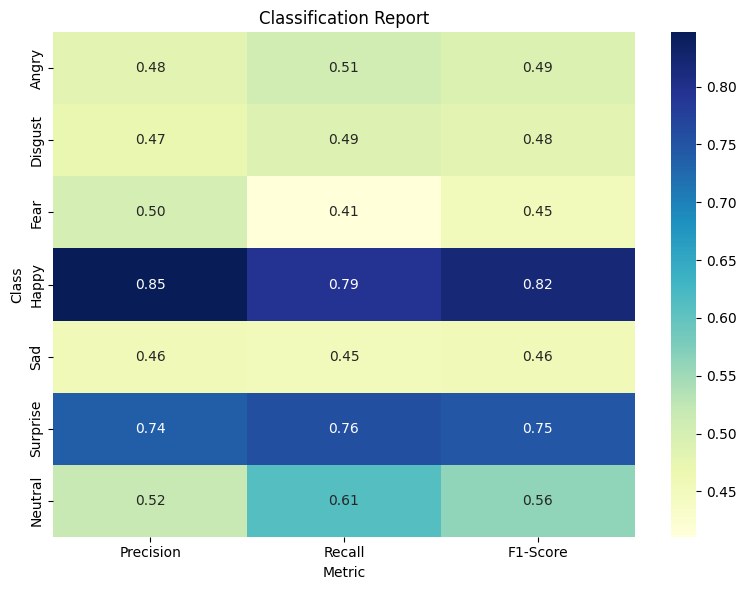

<ipython-input-43-be3cfa3ef64b>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1_scores, palette="viridis")


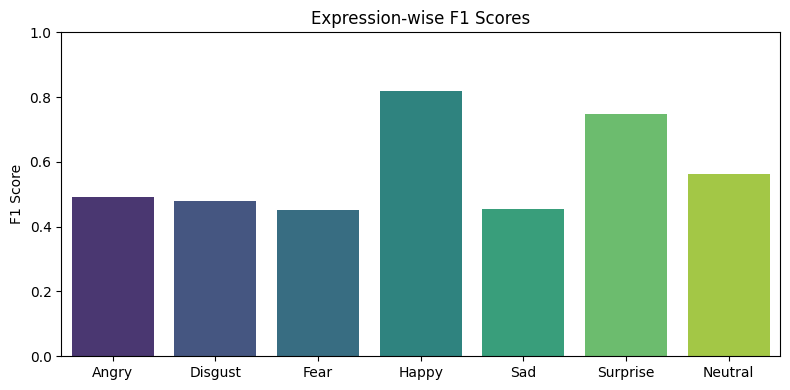

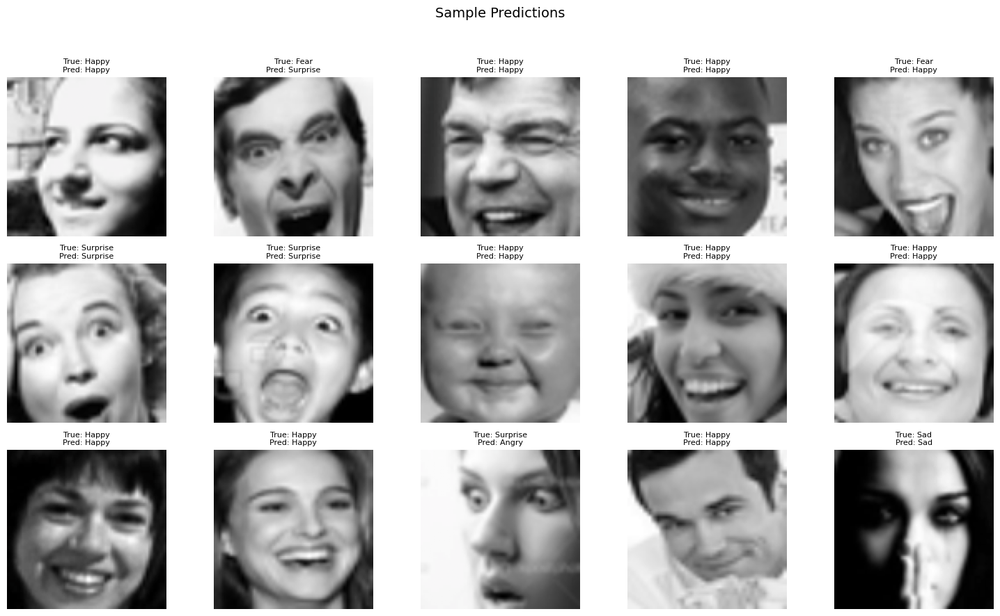

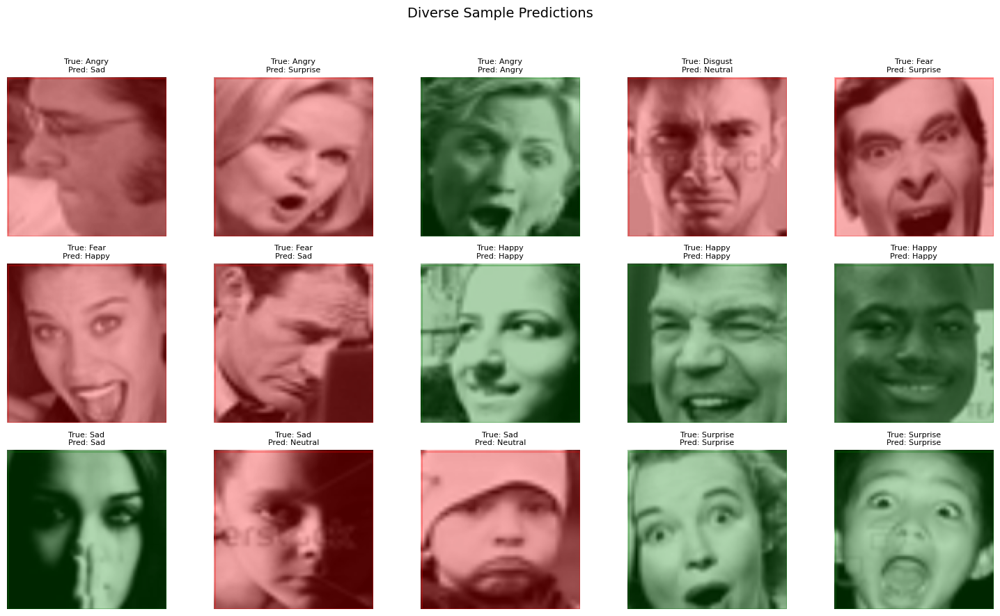

Performance metrics recorded in 'performance_metrics.txt'.


In [ ]:
test_model(model, test_loader, criterion, class_names, device)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('resnet18', pretrained=True, num_classes=num_classes)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

trained_model = train_model(model, optimizer, criterion, train_loader, val_loader, device, num_epochs=30, model_save_path="/content/resnet18.pth")

model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]

Epoch 1/30  Train Loss: 1.4539  Train Acc: 0.4588  Val Loss: 1.2647  Val Acc: 0.5120


Epoch 2/30  Train Loss: 0.9208  Train Acc: 0.6586  Val Loss: 1.1444  Val Acc: 0.5686


Epoch 3/30  Train Loss: 0.6892  Train Acc: 0.7539  Val Loss: 1.1659  Val Acc: 0.5733


Epoch 4/30  Train Loss: 0.5044  Train Acc: 0.8293  Val Loss: 1.1985  Val Acc: 0.5883


Epoch 5/30  Train Loss: 0.3588  Train Acc: 0.8883  Val Loss: 1.2727  Val Acc: 0.5897


Epoch 6/30  Train Loss: 0.2472  Train Acc: 0.9275  Val Loss: 1.3329  Val Acc: 0.5989


Epoch 7/30  Train Loss: 0.1682  Train Acc: 0.9539  Val Loss: 1.4582  Val Acc: 0.5912


Epoch 8/30  Train Loss: 0.1203  Train Acc: 0.9685  Val Loss: 1.5385  Val Acc: 0.5943


Epoch 9/30  Train Loss: 0.0872  Train Acc: 0.9780  Val Loss: 1.6221  Val Acc: 0.5978


Epoch 10/30  Train Loss: 0.0643  Train Acc: 0.9844  Val Loss: 1.7607  Val Acc: 0.5960


Epoch 11/30  Train Loss: 0.0515  Train Acc: 0.9868  Val Loss: 1.7905  Val Acc: 0.6001


Epoch 12/30  Train Loss: 0.0429  Train Acc: 0.9888  Val Loss: 1.8969  Val Acc: 0.6028


Epoch 13/30  Train Loss: 0.0363  Train Acc: 0.9904  Val Loss: 1.9229  Val Acc: 0.6051


Epoch 14/30  Train Loss: 0.0310  Train Acc: 0.9923  Val Loss: 2.0037  Val Acc: 0.6057


Epoch 15/30  Train Loss: 0.0268  Train Acc: 0.9930  Val Loss: 2.0854  Val Acc: 0.6070


Epoch 16/30  Train Loss: 0.0255  Train Acc: 0.9929  Val Loss: 2.1943  Val Acc: 0.6051


Epoch 17/30  Train Loss: 0.0241  Train Acc: 0.9930  Val Loss: 2.2250  Val Acc: 0.6012


Epoch 18/30  Train Loss: 0.0215  Train Acc: 0.9941  Val Loss: 2.2625  Val Acc: 0.6059


Epoch 19/30  Train Loss: 0.0188  Train Acc: 0.9946  Val Loss: 2.3166  Val Acc: 0.6105


Epoch 20/30  Train Loss: 0.0182  Train Acc: 0.9945  Val Loss: 2.3147  Val Acc: 0.6030


Epoch 21/30  Train Loss: 0.0187  Train Acc: 0.9943  Val Loss: 2.3915  Val Acc: 0.6055


Epoch 22/30  Train Loss: 0.0178  Train Acc: 0.9949  Val Loss: 2.3905  Val Acc: 0.6032


Epoch 23/30  Train Loss: 0.0163  Train Acc: 0.9950  Val Loss: 2.4891  Val Acc: 0.6051


Epoch 24/30  Train Loss: 0.0171  Train Acc: 0.9948  Val Loss: 2.4642  Val Acc: 0.6082


Epoch 25/30  Train Loss: 0.0169  Train Acc: 0.9945  Val Loss: 2.5414  Val Acc: 0.6016


Epoch 26/30  Train Loss: 0.0169  Train Acc: 0.9946  Val Loss: 2.4882  Val Acc: 0.6057


Epoch 27/30  Train Loss: 0.0159  Train Acc: 0.9952  Val Loss: 2.5254  Val Acc: 0.6149


Epoch 28/30  Train Loss: 0.0135  Train Acc: 0.9957  Val Loss: 2.5866  Val Acc: 0.6109


Epoch 29/30  Train Loss: 0.0153  Train Acc: 0.9952  Val Loss: 2.5825  Val Acc: 0.6059


Epoch 30/30  Train Loss: 0.0158  Train Acc: 0.9949  Val Loss: 2.6371  Val Acc: 0.6091


Test Loss: 2.5620  Test Acc: 0.6255  Sklearn Acc: 0.6255

Classification Report:
              precision    recall  f1-score   support

           0     0.5357    0.4988    0.5166       842
           1     0.7400    0.4512    0.5606        82
           2     0.4595    0.4465    0.4529       813
           3     0.8397    0.8419    0.8408      1556
           4     0.4847    0.4816    0.4831       922
           5     0.7139    0.7884    0.7493       690
           6     0.5576    0.5797    0.5685      1085

    accuracy                         0.6255      5990
   macro avg     0.6187    0.5840    0.5960      5990
weighted avg     0.6238    0.6255    0.6238      5990

Precision: 0.6238
Accuracy:  0.6255
Recall:    0.6255
F1 Score:  0.6238


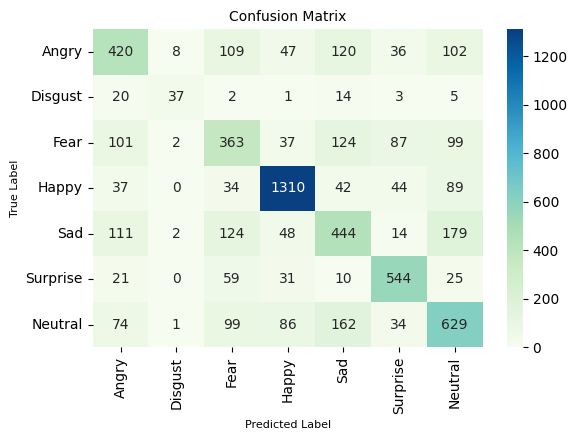

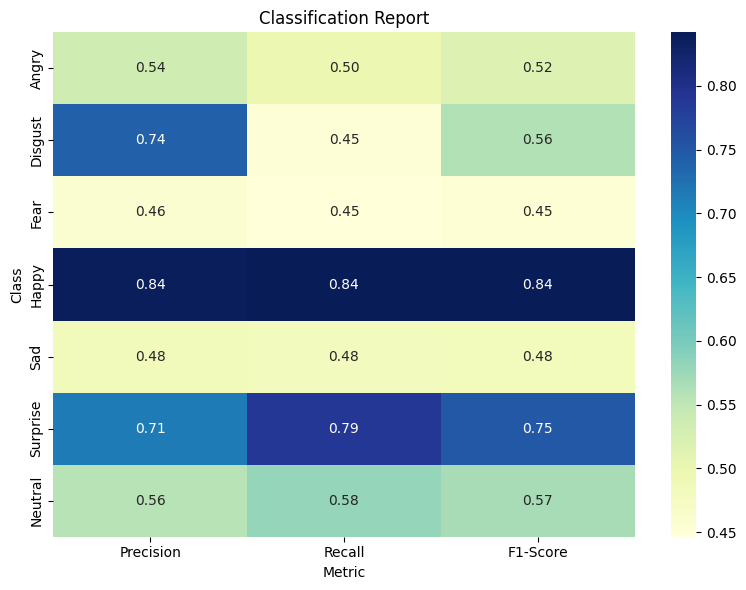

<ipython-input-43-be3cfa3ef64b>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1_scores, palette="viridis")


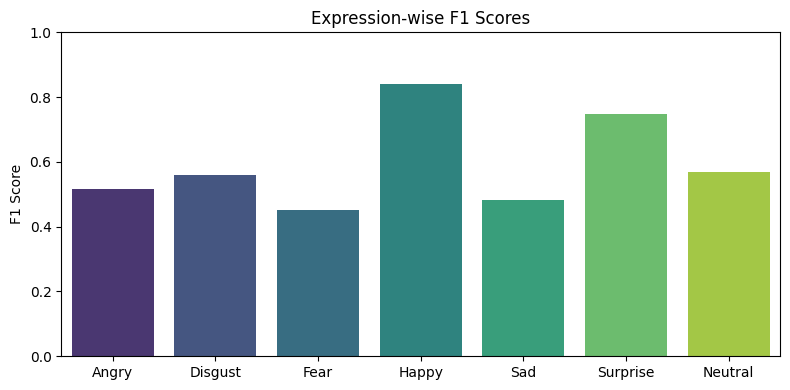

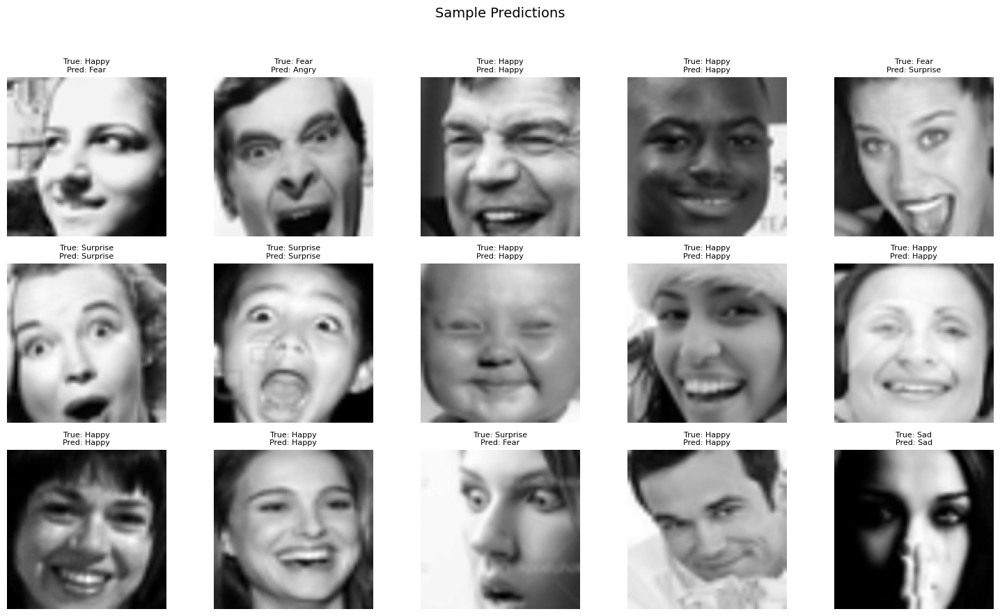

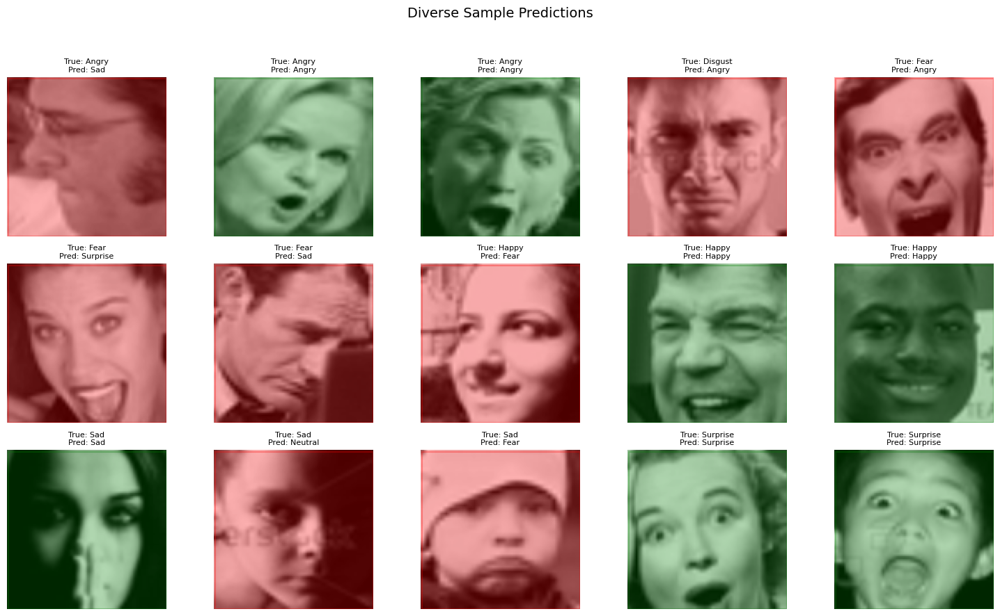

Performance metrics recorded in 'performance_metrics.txt'.


In [ ]:
test_model(model, test_loader, criterion, class_names, device)

# Again LIME after Alignment

/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name xception to current legacy_xception.
  model = create_fn(
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/1000 [00:00<?, ?it/s]

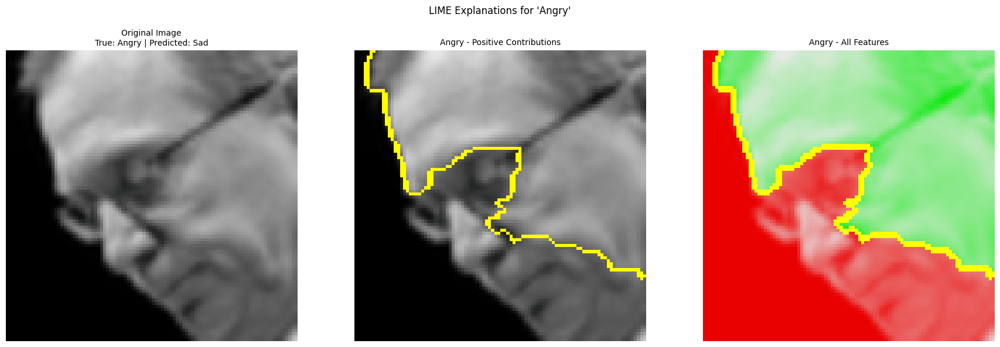

  0%|          | 0/1000 [00:00<?, ?it/s]

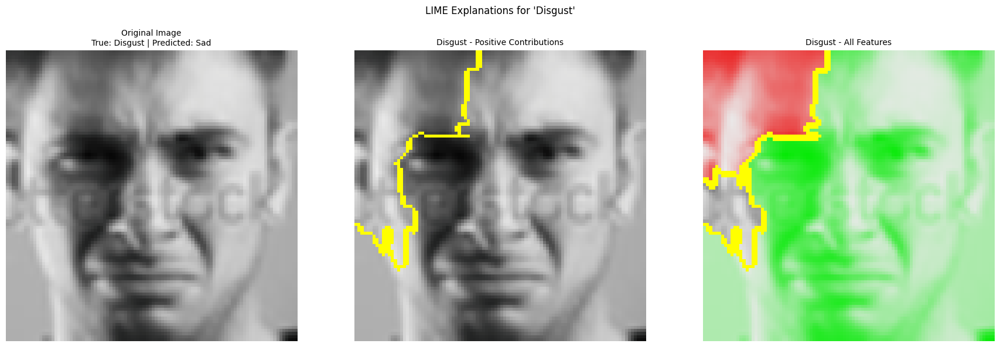

  0%|          | 0/1000 [00:00<?, ?it/s]

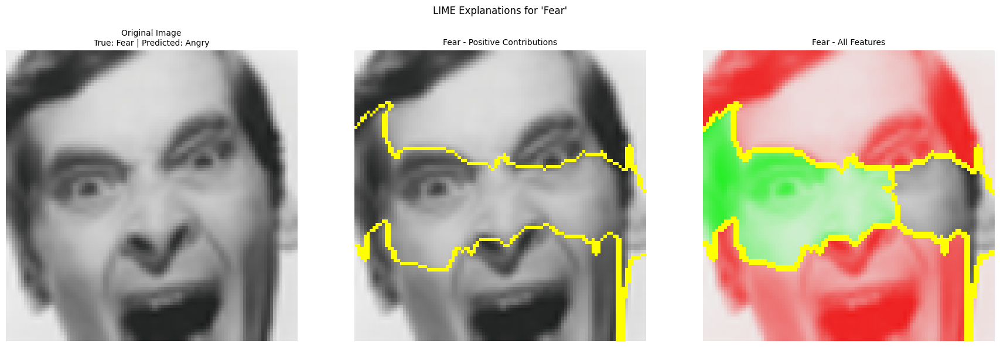

  0%|          | 0/1000 [00:00<?, ?it/s]

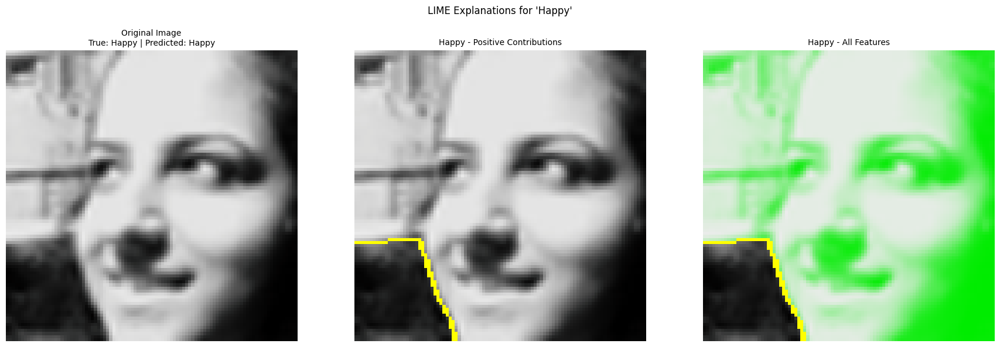

  0%|          | 0/1000 [00:00<?, ?it/s]

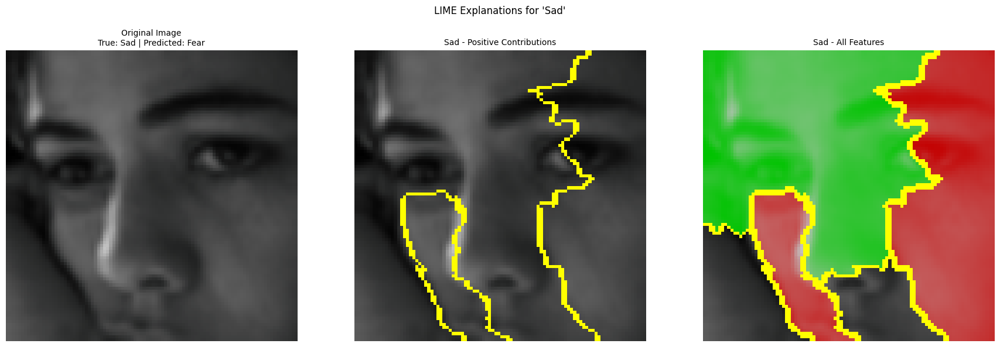

  0%|          | 0/1000 [00:00<?, ?it/s]

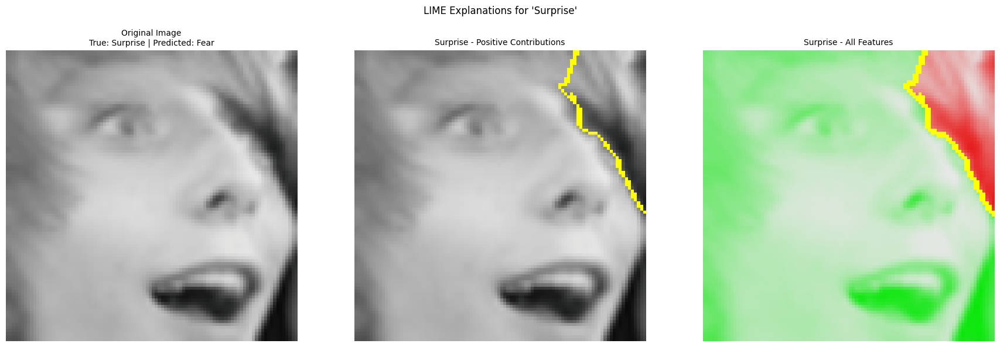

  0%|          | 0/1000 [00:00<?, ?it/s]

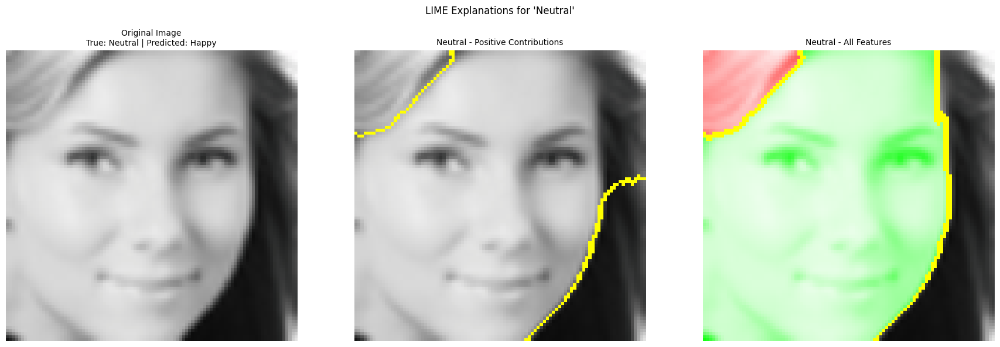

In [ ]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage
import numpy as np
import torch
import timm
from torchvision import transforms
from torchvision.transforms import functional as TF

# --------------------------------------------------------
# Project Parameters and Model Loading
# --------------------------------------------------------
class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
num_classes = len(class_names)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Example: using the 'xception' model; update model_path as needed.
model = timm.create_model('xception', pretrained=True, num_classes=num_classes)
model_path = "/content/xception.pth"  # Update this with your weights path
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

# --------------------------------------------------------
# Transformations (should match the training preprocessing)
# --------------------------------------------------------
# For model input (normalized)
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize([128, 128]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Denormalization function to revert the normalization (for display purposes)
def denormalize(img_tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    img = img_tensor.clone()
    for c, m, s in zip(range(img.shape[0]), mean, std):
        img[c] = img[c] * s + m
    return img

# --------------------------------------------------------
# Batch Prediction Function for LIME
# --------------------------------------------------------
def batch_predict(images):
    """
    Accepts a list of PIL images, applies the transform,
    and returns the model's prediction probabilities as a numpy array.
    """
    model.eval()
    batch = []
    for img in images:
        # Use the same transformation as for model input
        img_tensor = transform(np.array(img))
        batch.append(img_tensor)
    batch = torch.stack(batch, dim=0).to(device)
    with torch.no_grad():
        logits = model(batch)
        probs = torch.softmax(logits, dim=1)
    return probs.cpu().numpy()

# --------------------------------------------------------
# Select a Sample for Each Class from the Test Loader
# --------------------------------------------------------
# Assume test_loader is defined and provides batches of images and labels.
# We iterate through test_loader to collect one sample per class based on the actual (true) label.
samples = {}  # Dictionary mapping class index to (image_tensor, label)
for images, labels in test_loader:
    for i in range(len(labels)):
        label = labels[i].item()
        if label not in samples:
            samples[label] = (images[i].cpu(), labels[i].cpu())
        if len(samples) == num_classes:
            break
    if len(samples) == num_classes:
        break

# Convert tensor image to PIL image using ToPILImage, after denormalizing for correct display.
to_pil = ToPILImage()

# --------------------------------------------------------
# For Each Class, Generate LIME Explanations and Display the Original Image
# --------------------------------------------------------
for cls in range(num_classes):
    # Retrieve the sample image and its true label for this class
    img_tensor, true_label_tensor = samples[cls]
    # Denormalize the image for correct visualization
    orig_tensor = denormalize(img_tensor)
    # Convert to PIL image
    orig_pil_image = to_pil(orig_tensor)
    true_label = class_names[true_label_tensor.item()]

    # Get the model prediction for this sample using the transformed (normalized) image.
    input_tensor = transform(np.array(orig_pil_image)).unsqueeze(0).to(device)
    with torch.no_grad():
        logits = model(input_tensor)
        probs = torch.softmax(logits, dim=1)
        pred_class = torch.argmax(probs, dim=1).item()
    predicted_label = class_names[pred_class]

    # Display a plot with the original image alongside its LIME explanations.
    # Create a new figure with three subplots in one row.
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Subplot 1: Original Image (before any LIME modifications)
    axs[0].imshow(orig_pil_image)
    axs[0].set_title(f"Original Image\nTrue: {true_label} | Predicted: {predicted_label}", fontsize=10)
    axs[0].axis('off')

    # Generate LIME explanation for the sample image.
    explainer = lime_image.LimeImageExplainer()
    np_image = np.array(orig_pil_image)
    explanation = explainer.explain_instance(np_image,
                                             batch_predict,
                                             top_labels=num_classes,
                                             hide_color=0,
                                             num_samples=1000)

    # Subplot 2: LIME Explanation showing only positive contributions
    temp, mask = explanation.get_image_and_mask(cls,
                                                  positive_only=True,
                                                  num_features=7,
                                                  hide_rest=False)
    img_boundary = mark_boundaries(temp / 255.0, mask)
    axs[1].imshow(img_boundary)
    axs[1].set_title(f"{class_names[cls]} - Positive Contributions", fontsize=10)
    axs[1].axis('off')

    # Subplot 3: LIME Explanation showing all features (both positive and negative)
    temp_all, mask_all = explanation.get_image_and_mask(cls,
                                                          positive_only=False,
                                                          num_features=7,
                                                          hide_rest=False)
    img_boundary_all = mark_boundaries(temp_all / 255.0, mask_all)
    axs[2].imshow(img_boundary_all)
    axs[2].set_title(f"{class_names[cls]} - All Features", fontsize=10)
    axs[2].axis('off')

    plt.suptitle(f"LIME Explanations for '{class_names[cls]}'", fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


# Convert to ONNX for real-time detection using webcam

In [ ]:
import onnx
from onnxsim import simplify

pth_path = "/content/xception.pth"
onnx_path = "/content/xception.onnx"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = timm.create_model('xception', pretrained=True, num_classes=num_classes)
model.load_state_dict(torch.load(pth_path, map_location=device))
model.eval().to(device)

# Dummy input (96x96)
dummy_input = torch.randn(1, 3, 96, 96).to(device)

torch.onnx.export(
    model,
    dummy_input,
    onnx_path,
    input_names=["input"],
    output_names=["output"],
    opset_version=11,
    dynamic_axes={
        "input": {0: "batch_size"},
        "output": {0: "batch_size"}
    }
)

model = onnx.load("/content/xception.onnx")
model_simp, check = simplify(model)
onnx.save(model_simp, "/content/xception_simplified.onnx")

/usr/local/lib/python3.11/dist-packages/timm/models/_factory.py:126: UserWarning: Mapping deprecated model name xception to current legacy_xception.
  model = create_fn(


In [ ]:
import onnx
from onnxsim import simplify

pth_path = "/content/mobilenet.pth"
onnx_path = "/content/mobilenet.onnx"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = timm.create_model('mobilenetv3_large_100', pretrained=True, num_classes=num_classes)
model.load_state_dict(torch.load(pth_path, map_location=device))
model.eval().to(device)

# Dummy input (96x96)
dummy_input = torch.randn(1, 3, 96, 96).to(device)

torch.onnx.export(
    model,
    dummy_input,
    onnx_path,
    input_names=["input"],
    output_names=["output"],
    opset_version=11,
    dynamic_axes={
        "input": {0: "batch_size"},
        "output": {0: "batch_size"}
    }
)

model = onnx.load("/content/mobilenet.onnx")
model_simp, check = simplify(model)
onnx.save(model_simp, "/content/mobilenet_simplified.onnx")

In [ ]:
import onnx
from onnxsim import simplify

pth_path = "/content/efficientnet.pth"
onnx_path = "/content/efficientnet.onnx"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=num_classes)
model.load_state_dict(torch.load(pth_path, map_location=device))
model.eval().to(device)

# Dummy input (96x96)
dummy_input = torch.randn(1, 3, 96, 96).to(device)

torch.onnx.export(
    model,
    dummy_input,
    onnx_path,
    input_names=["input"],
    output_names=["output"],
    opset_version=11,
    dynamic_axes={
        "input": {0: "batch_size"},
        "output": {0: "batch_size"}
    }
)

model = onnx.load("/content/efficientnet.onnx")
model_simp, check = simplify(model)
onnx.save(model_simp, "/content/efficientnet_simplified.onnx")

In [ ]:
import onnx
from onnxsim import simplify

pth_path = "/content/resnet18.pth"
onnx_path = "/content/resnet.onnx"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = timm.create_model('resnet18', pretrained=True, num_classes=num_classes)
model.load_state_dict(torch.load(pth_path, map_location=device))
model.eval().to(device)

# Dummy input (96x96)
dummy_input = torch.randn(1, 3, 96, 96).to(device)

torch.onnx.export(
    model,
    dummy_input,
    onnx_path,
    input_names=["input"],
    output_names=["output"],
    opset_version=11,
    dynamic_axes={
        "input": {0: "batch_size"},
        "output": {0: "batch_size"}
    }
)

model = onnx.load("/content/resnet.onnx")
model_simp, check = simplify(model)
onnx.save(model_simp, "/content/resnet_simplified.onnx")